<a href="https://colab.research.google.com/github/SergeiVKalinin/camm_hackathon/blob/k4my4r/docs/day_9_/Posterior_Functions_and_Hypothesis_Driven_Selection_Kalinin.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install gpytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 291.2/291.2 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.8/174.8 kB 17.0 MB/s eta 0:00:00


In [2]:
import numpy as np
import torch
import gpytorch
import matplotlib.pyplot as plt

torch.manual_seed(0)
np.random.seed(0)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {device}')
dtype = torch.float64
torch.set_default_dtype(dtype)

Using device: cuda


In [3]:
#@title GT functions

def f1(x, A=1.0, tau=1.6, offset=0.05):
    """
    Monotonic increasing function with saturation.
    """
    return offset + A * (1.0 - np.exp(-x / tau))

def f2(x, L=1.0, x0=2.5, k=3.0, offset=0.05):
    """
    Sigmoid-like transition.
    """
    return offset + L / (1 + np.exp(-k * (x - x0)))

def f3(x, x0=2.5, gamma=0.25, A=1.0, offset=0.05):
    """
    Lorentzian resonance peak.
    """
    return offset + A * gamma**2 / ((x - x0)**2 + gamma**2)

def f4(x, A=1.0, gamma=0.35, w=4.0, offset=0.0):
    """
    Damped oscillatory response.
    """
    return offset + A * np.exp(-gamma * x) * np.cos(w * x)

In [4]:
#@title auxilary functions

def generate_experiment_data(f_true, x_grid, n_points=9, noise_std=0.05, seed=None, plot=True):
    """
    Generate sparse noisy experimental observations from a ground truth function.

    Parameters
    ----------
    f_true : function
        Ground truth function f(x)
    x_grid : array
        Dense grid of x values
    n_train : int
        Number of experimental points
    noise_std : float
        Standard deviation of Gaussian noise
    seed : int or None
        Random seed for reproducibility
    plot : bool
        Whether to visualize the data

    Returns
    -------
    x_train, y_train
    """

    if seed is not None:
        np.random.seed(seed)

    idx = np.sort(np.random.choice(np.arange(len(x_grid)), size=n_points, replace=False))
    x_train = x_grid[idx]
    y_train = f_true(x_train) + np.random.normal(0, noise_std, size=n_points)

    if plot:
        plt.figure(figsize=(7,4))
        plt.plot(x_grid, f_true(x_grid), label="True function")
        plt.scatter(x_train, y_train, color="red", s=60, label="Observed points", zorder=3)
        plt.xlabel("x")
        plt.ylabel("y")
        plt.legend()
        plt.show()

    return x_train, y_train

In [5]:
#@title GP model

class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super().__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel()
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

def train_gp(model, likelihood, train_x, train_y, lr=0.05, training_iter=200, plot=True):
    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    losses = []

    for i in range(training_iter):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

    if plot:
        plt.figure(figsize=(6, 3))
        plt.plot(losses)
        plt.xlabel("Iteration")
        plt.ylabel("Negative log marginal likelihood")
        plt.title("Training loss")
        plt.show()

    return losses

# Hackathon Task

The objective is to explore an alternative workflow for interpreting sparse experimental data using Gaussian Processes (GP).


Instead of relying solely on the most probable GP prediction (i.e., the posterior mean), we consider the following approach:

1. Fit a GP model to a small set of noisy observations.
2. Draw multiple candidate functions from the GP posterior (Thompson-style sampling).
3. Treat these sampled functions as plausible hypotheses consistent with the data.
4. Select the final candidate based on external criteria such as known physics, constraints, or expected qualitative behavior.


In this notebook we implement the first three steps of this workflow.
The goal of the hackathon is to develop possible realizations of Step 4:
designing criteria or algorithms for ranking and selecting the most meaningful prediction from the GP posterior.


**Please, do not forget to submit your result. A short YouTube tutorial from Utkarsh explaining how to submit your results:**
https://www.youtube.com/watch?v=QcwQkAocrDY&t=35s

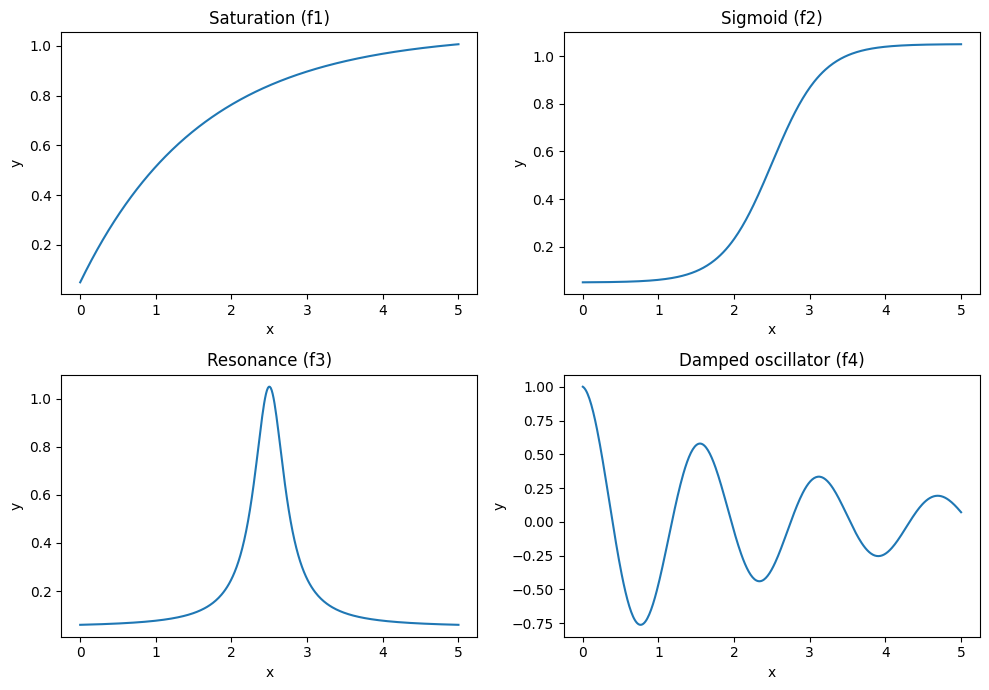

In [6]:
x_grid = np.linspace(0.0, 5.0, 400)
y1 = f1(x_grid)
y2 = f2(x_grid)
y3 = f3(x_grid)
y4 = f4(x_grid)

fig, ax = plt.subplots(2,2, figsize = (10,7))

for ax_ ,yy in zip(ax.flatten(), [y1, y2, y3, y4]):
  ax_.plot(x_grid, yy)
  ax_.set_xlabel("x")
  ax_.set_ylabel("y")

for ax_ ,ttl in zip(ax.flatten(), ['Saturation (f1)', 'Sigmoid (f2)', 'Resonance (f3)', 'Damped oscillator (f4)']):
  ax_.set_title(ttl)

plt.tight_layout()
# plt.show()

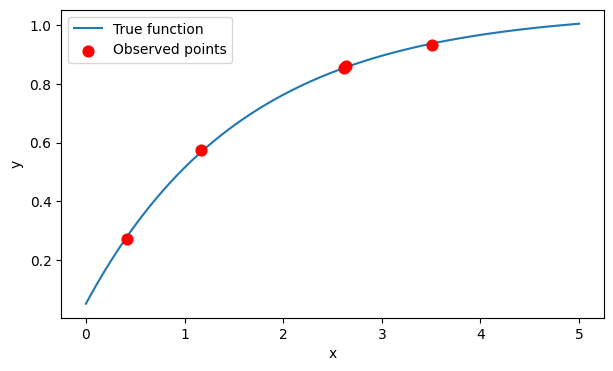

In [7]:
#choose function
f= f1

x_exp, y_exp = generate_experiment_data(f, x_grid, n_points=5, noise_std=0.01, seed=42)

#converting to torch.tensor
train_x = torch.tensor(x_exp, dtype=dtype, device=device).unsqueeze(-1)
train_y = torch.tensor(y_exp, dtype=dtype, device=device)

test_x = torch.tensor(x_grid, dtype=dtype, device=device).unsqueeze(-1)

In [8]:
likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = ExactGPModel(train_x, train_y, likelihood)

model = model.to(device=device, dtype=dtype)
likelihood = likelihood.to(device=device, dtype=dtype)



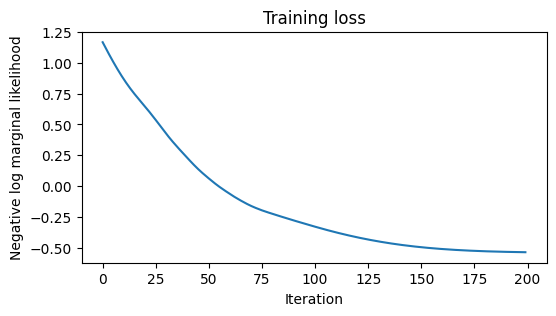

In [9]:
losses = train_gp(model, likelihood, train_x, train_y, lr=0.05, training_iter=200, plot=True)

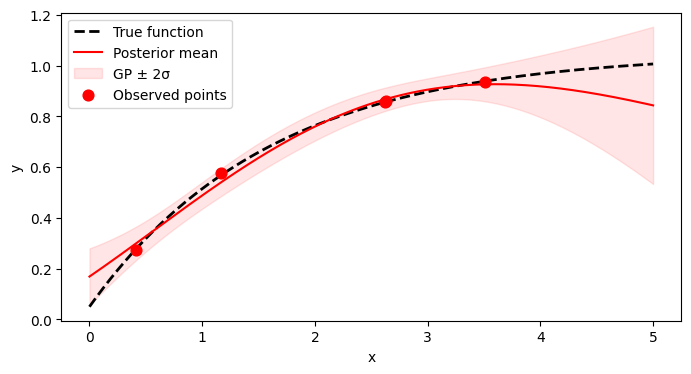

In [10]:
model.eval()
likelihood.eval()

with torch.no_grad(), gpytorch.settings.fast_pred_var():
    posterior = model(test_x)
    pred_mean = posterior.mean.cpu().numpy()
    pred_std = posterior.stddev.cpu().numpy()

plt.figure(figsize=(8, 4))
plt.plot(x_grid, f(x_grid), 'k--', label="True function", linewidth=2)
plt.plot(x_grid, pred_mean, 'r',label="Posterior mean", linestyle="-")
plt.fill_between(
    x_grid,
    pred_mean - 2 * pred_std,
    pred_mean + 2 * pred_std,
    alpha=0.1,
    label="GP ± 2σ",
    color='r'
)
plt.scatter(x_exp, y_exp, color="red", s=60, label="Observed points", zorder=3)
plt.xlabel("x")
plt.ylabel("y")
plt.legend()
plt.show()

In [11]:
#Tompson sampling

n_candidates = 64 #number of the cundidate functions

with torch.no_grad():
    posterior = model(test_x)
    samples = posterior.sample(torch.Size([n_candidates]))

samples_np = samples.cpu().numpy() # - candidate function

/usr/local/lib/python3.12/dist-packages/linear_operator/utils/cholesky.py:41: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(


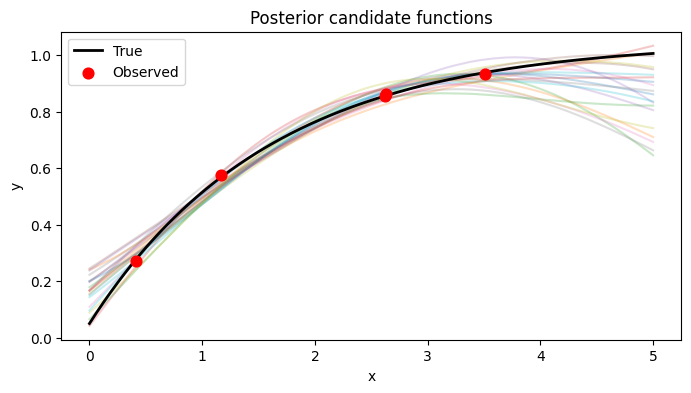

In [12]:
plt.figure(figsize=(8, 4))

for i in range(min(n_candidates, 20)):
    plt.plot(x_grid, samples_np[i], alpha=0.25)

plt.plot(x_grid, f(x_grid), color="black", linewidth=2, label="True")
plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Posterior candidate functions")
plt.legend()
plt.show()

# Can we design criteria or algorithms for ranking and selecting the most meaningful candidate function?

In [13]:
# you code

## Derivative at the edge

Let's try to make derivative zero on one end and see the effects.

Unweighted mean |f'(x_max)|: 0.1314
Weighted mean   |f'(x_max)|: 0.0391
Effective sample size: 394.2 out of 1024


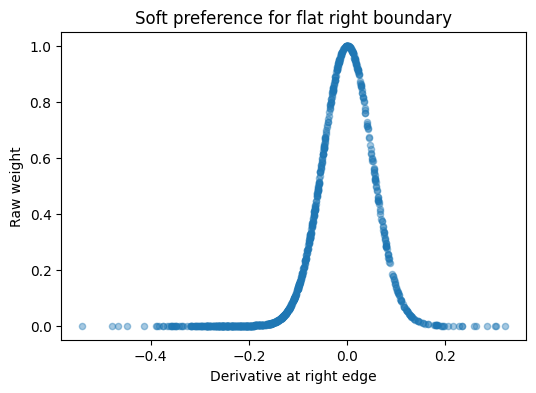

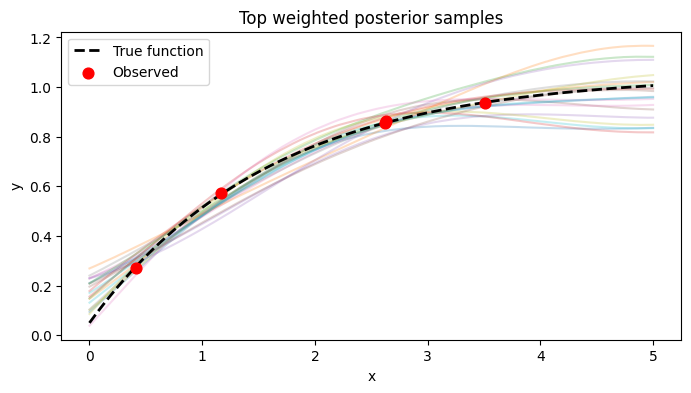

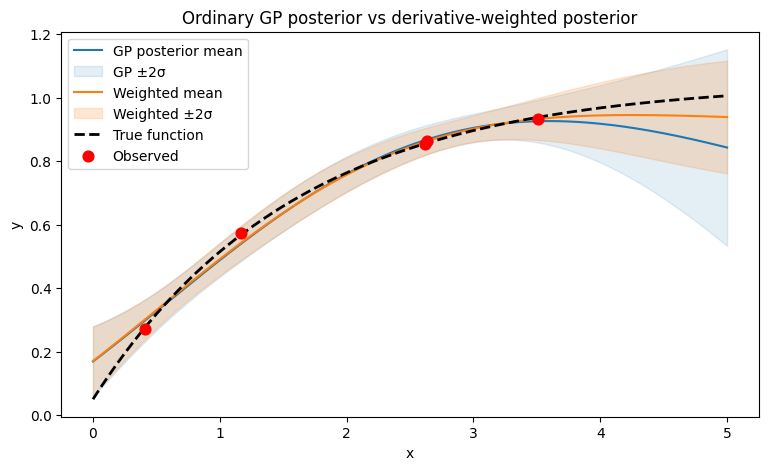

In [14]:
# ============================================================
# Weighted posterior by soft derivative constraint at x_max
# ============================================================

n_candidates = 1024

with torch.no_grad():
    posterior = model(test_x)
    samples = posterior.sample(torch.Size([n_candidates]))

samples_np = samples.cpu().numpy()   # shape: (n_candidates, n_grid)

# --- estimate derivative at the right edge x_max ---
dx = x_grid[1] - x_grid[0]

# simple one-sided finite difference at the right boundary
d_right = (samples_np[:, -1] - samples_np[:, -2]) / dx

# optional: more stable 3-point one-sided derivative
# d_right = (3*samples_np[:, -1] - 4*samples_np[:, -2] + samples_np[:, -3]) / (2*dx)

# --- define soft weights based on closeness of derivative to zero ---
slope_tol = 0.05   # adjust this; smaller => stronger preference for flat edge

raw_weights = np.exp(-0.5 * (d_right / slope_tol)**2)
weights = raw_weights / np.sum(raw_weights)

# --- weighted posterior mean ---
weighted_mean = np.sum(weights[:, None] * samples_np, axis=0)

# --- weighted posterior variance ---
weighted_var = np.sum(weights[:, None] * (samples_np - weighted_mean[None, :])**2, axis=0)
weighted_std = np.sqrt(weighted_var)

# --- unweighted posterior mean/std from raw samples for comparison ---
sample_mean = np.mean(samples_np, axis=0)
sample_std = np.std(samples_np, axis=0)

# ============================================================
# Diagnostics
# ============================================================

print(f"Unweighted mean |f'(x_max)|: {np.mean(np.abs(d_right)):.4f}")
print(f"Weighted mean   |f'(x_max)|: {np.sum(weights * np.abs(d_right)):.4f}")
print(f"Effective sample size: {1.0 / np.sum(weights**2):.1f} out of {n_candidates}")

# ============================================================
# Plot weights vs derivative
# ============================================================

plt.figure(figsize=(6,4))
plt.scatter(d_right, raw_weights, alpha=0.4, s=20)
plt.xlabel("Derivative at right edge")
plt.ylabel("Raw weight")
plt.title("Soft preference for flat right boundary")
plt.show()

# ============================================================
# Plot a subset of weighted candidate functions
# ============================================================

top_idx = np.argsort(weights)[-20:]

plt.figure(figsize=(8,4))
for idx in top_idx:
    plt.plot(x_grid, samples_np[idx], alpha=0.25)

plt.plot(x_grid, f(x_grid), 'k--', linewidth=2, label="True function")
plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")
plt.xlabel("x")
plt.ylabel("y")
plt.title("Top weighted posterior samples")
plt.legend()
plt.show()

# ============================================================
# Compare ordinary GP posterior vs weighted posterior
# ============================================================

plt.figure(figsize=(9,5))

# ordinary posterior from GP
plt.plot(x_grid, pred_mean, color='tab:blue', label='GP posterior mean')
plt.fill_between(
    x_grid,
    pred_mean - 2*pred_std,
    pred_mean + 2*pred_std,
    color='tab:blue',
    alpha=0.12,
    label='GP ±2σ'
)

# weighted posterior from sampled functions
plt.plot(x_grid, weighted_mean, color='tab:orange', label='Weighted mean')
plt.fill_between(
    x_grid,
    weighted_mean - 2*weighted_std,
    weighted_mean + 2*weighted_std,
    color='tab:orange',
    alpha=0.18,
    label='Weighted ±2σ'
)

plt.plot(x_grid, f(x_grid), 'k--', linewidth=2, label='True function')
plt.scatter(x_exp, y_exp, color='red', s=60, zorder=3, label='Observed')
plt.xlabel("x")
plt.ylabel("y")
plt.title("Ordinary GP posterior vs derivative-weighted posterior")
plt.legend()
plt.show()

## Derivative at both edges

In [15]:
# ============================================================
# Weighted posterior by soft derivative constraints at both edges
# ============================================================

n_candidates = 4096

with torch.no_grad():
    posterior = model(test_x)
    samples = posterior.sample(torch.Size([n_candidates]))

samples_np = samples.cpu().numpy()   # shape: (n_candidates, n_grid)

dx = x_grid[1] - x_grid[0]

# 3-point one-sided derivatives at left and right boundaries
d_left  = (-3*samples_np[:, 0] + 4*samples_np[:, 1] - samples_np[:, 2]) / (2*dx)
d_right = ( 3*samples_np[:, -1] - 4*samples_np[:, -2] + samples_np[:, -3]) / (2*dx)

# tolerance for "close to zero slope"
slope_tol_left = 0.005
slope_tol_right = 0.005

raw_weights = np.exp(
    -0.5 * (d_left  / slope_tol_left )**2
    -0.5 * (d_right / slope_tol_right)**2
)

weights = raw_weights / np.sum(raw_weights)

# weighted mean and std
weighted_mean = np.sum(weights[:, None] * samples_np, axis=0)
weighted_var  = np.sum(weights[:, None] * (samples_np - weighted_mean[None, :])**2, axis=0)
weighted_std  = np.sqrt(weighted_var)

print(f"Weighted mean |f'(x_min)|: {np.sum(weights * np.abs(d_left)):.4f}")
print(f"Weighted mean |f'(x_max)|: {np.sum(weights * np.abs(d_right)):.4f}")
print(f"Effective sample size: {1.0 / np.sum(weights**2):.1f} out of {n_candidates}")

Weighted mean |f'(x_min)|: 0.0772
Weighted mean |f'(x_max)|: 0.0201
Effective sample size: 1.0 out of 4096


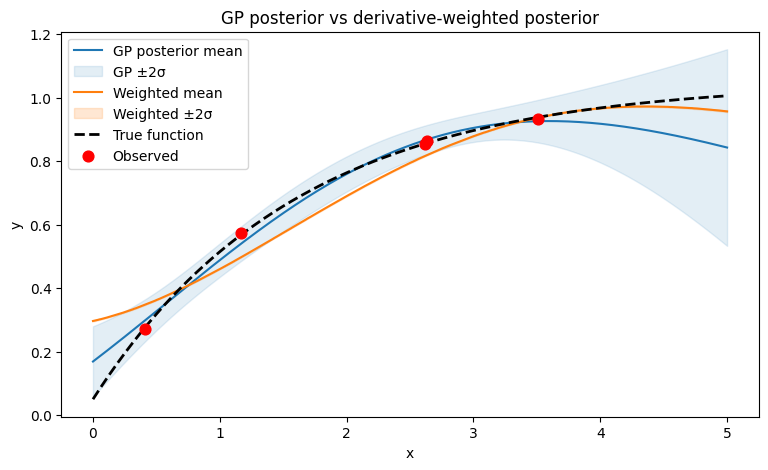

In [16]:
plt.figure(figsize=(9,5))

plt.plot(x_grid, pred_mean, color='tab:blue', label='GP posterior mean')
plt.fill_between(
    x_grid,
    pred_mean - 2*pred_std,
    pred_mean + 2*pred_std,
    color='tab:blue',
    alpha=0.12,
    label='GP ±2σ'
)

plt.plot(x_grid, weighted_mean, color='tab:orange', label='Weighted mean')
plt.fill_between(
    x_grid,
    weighted_mean - 2*weighted_std,
    weighted_mean + 2*weighted_std,
    color='tab:orange',
    alpha=0.18,
    label='Weighted ±2σ'
)

plt.plot(x_grid, f(x_grid), 'k--', linewidth=2, label='True function')
plt.scatter(x_exp, y_exp, color='red', s=60, zorder=3, label='Observed')
plt.xlabel("x")
plt.ylabel("y")
plt.title("GP posterior vs derivative-weighted posterior")
plt.legend()
plt.show()

## Functional form

Sampled posterior functions: (32768, 400)


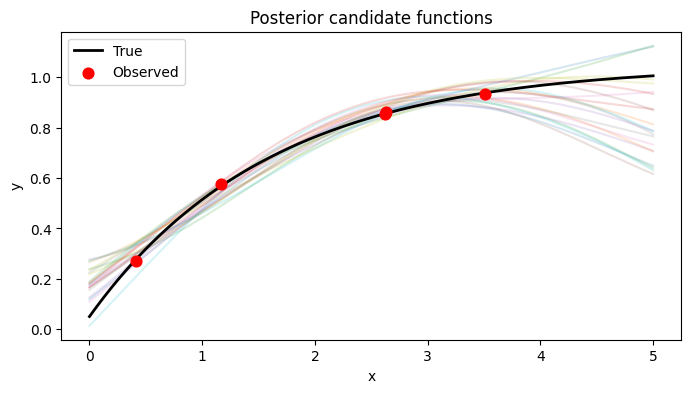

CHI2_SIGMA_MODE = constant
Using constant sigma = 0.05

Using reduced chi-square
BEST_DEGREE_SELECTION = lowest_degree_that_passes
WEIGHT_MODE = gaussian
Accepted samples: 32768 / 32768
Effective sample size: 24137.43

Degree-specific thresholds:
  degree 1: threshold = 5.0
  degree 2: threshold = 1.5
  degree 3: threshold = 1.2
  degree 4: threshold = 1.0

Accepted counts by selected degree:
  degree 1: 17831
  degree 2: 14929
  degree 3: 8
  degree 4: 0

Group masses by selected degree:
  degree 1: mass=0.286, count=17831
  degree 2: mass=0.713, count=14929
  degree 3: mass=0.000, count=8
  degree 4: mass=0.000, count=0


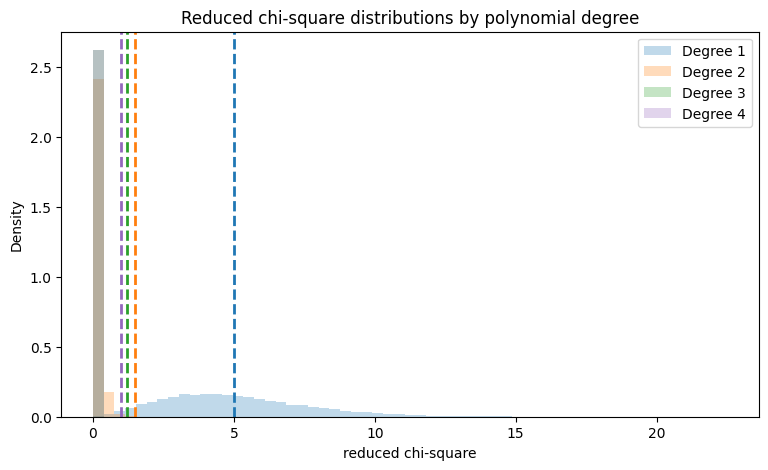

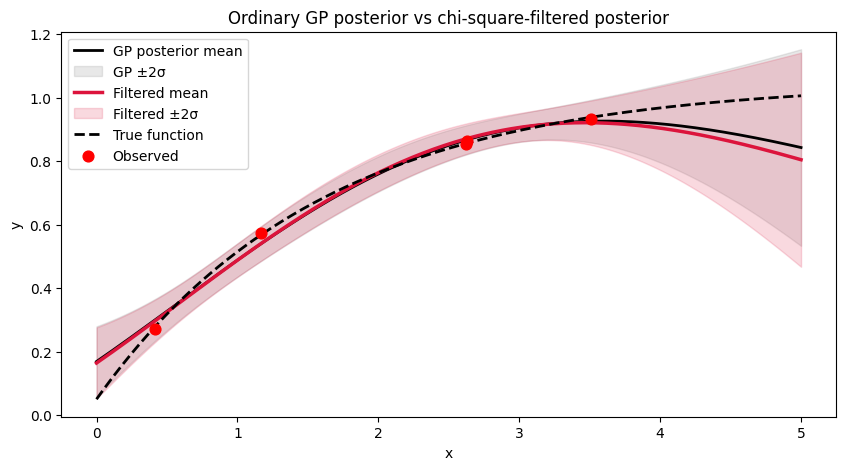

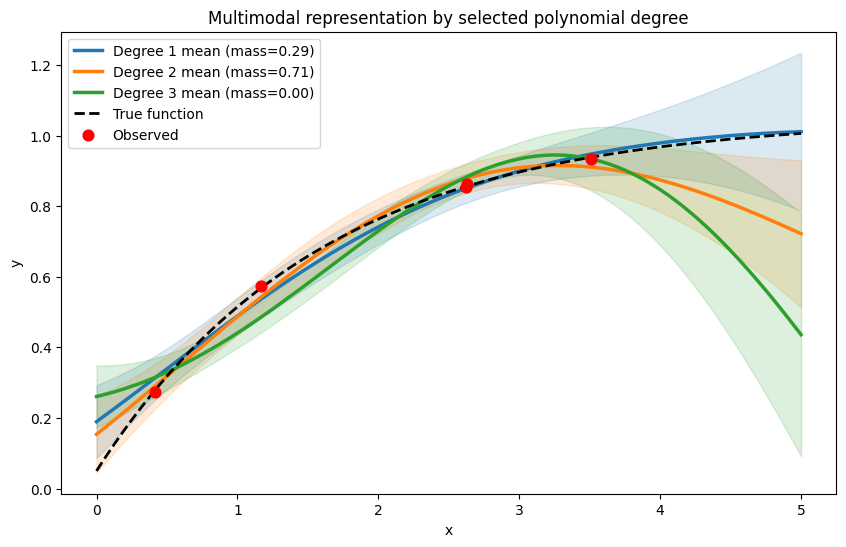

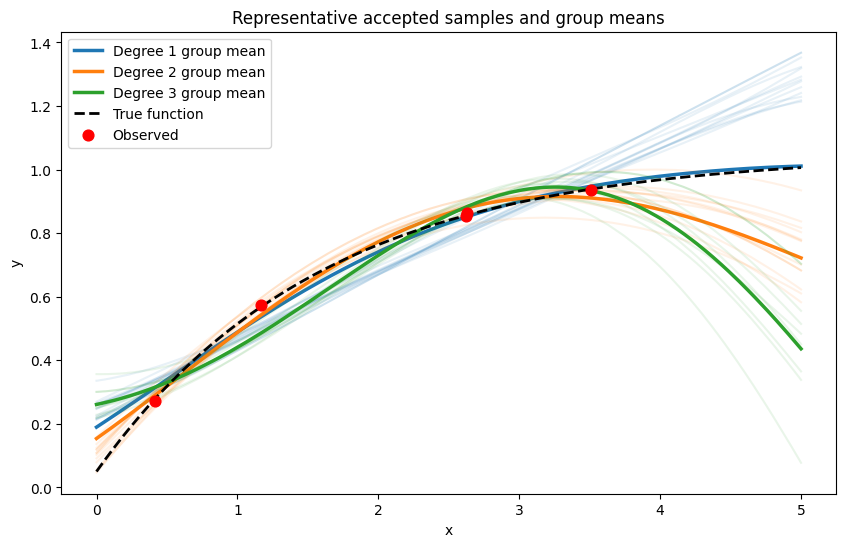

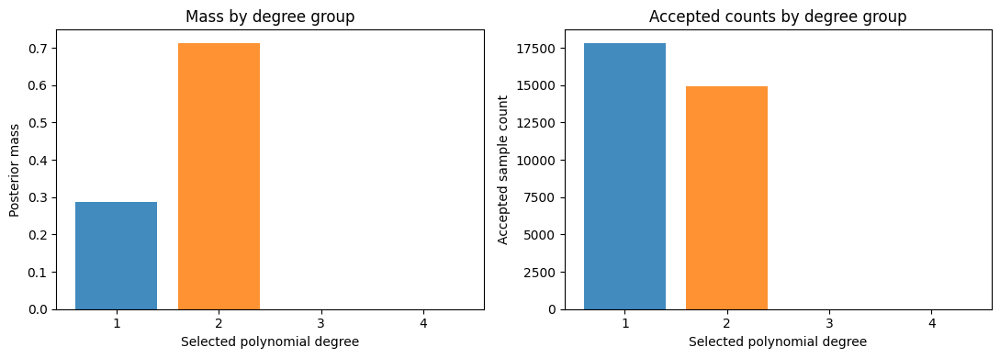


Representative accepted samples:
  degree 1: sample index = 17080, weight = 0.000048, reduced chi-square = 0.005616
  degree 2: sample index = 18516, weight = 0.000048, reduced chi-square = 0.000550
  degree 3: sample index = 5939, weight = 0.000048, reduced chi-square = 0.017562


In [20]:
# ============================================================
# Post-processing of posterior samples from an already trained GP
# Degree-specific reduced-chi-square filtering of polynomial fits
# ============================================================

import numpy as np
import torch
import gpytorch
import matplotlib.pyplot as plt

# ============================================================
# USER-TUNABLE SETTINGS
# ============================================================

N_CANDIDATES = 32 * 1024   # reduce if memory/runtime is an issue

DEGREES = [1, 2, 3, 4]

# --- how to define sigma(x) inside chi-square ---
CHI2_SIGMA_MODE = "constant"
# options:
#   "constant" -> sigma_k = CHI2_SIGMA_CONST
#   "gp_std"   -> sigma_k = GP posterior std at x_k

CHI2_SIGMA_CONST = 0.05
CHI2_SIGMA_FLOOR = 1e-6

# --- use reduced chi-square or raw chi-square ---
USE_REDUCED_CHI2 = True

# --- degree-specific acceptance thresholds ---
# reduced chi-square thresholds if USE_REDUCED_CHI2=True
# raw chi-square thresholds otherwise
CHI2_THRESHOLDS = {
    1: 5.0,
    2: 1.5,
    3: 1.2,
    4: 1.0,
}

# --- how to choose best degree if multiple pass ---
BEST_DEGREE_SELECTION = "lowest_degree_that_passes"
# options:
#   "lowest_degree_that_passes"
#   "minimum_score_among_passed"

# --- how to weight accepted samples ---
WEIGHT_MODE = "gaussian"
# options:
#   "uniform"
#   "gaussian"
#   "sharp"

# softness for weighting by accepted score, degree-specific
WEIGHT_SIGMA_BY_DEGREE = {
    1: 2.0,
    2: 1.5,
    3: 1.2,
    4: 1.0,
}

# plotting
N_REPRESENTATIVE_PER_GROUP = 12

GROUP_COLORS = {
    1: "tab:blue",
    2: "tab:orange",
    3: "tab:green",
    4: "tab:purple",
}

# ============================================================
# Sanity / setup
# ============================================================

model.eval()
if "likelihood" in globals():
    likelihood.eval()

score_name = "reduced chi-square" if USE_REDUCED_CHI2 else "chi-square"
has_true = "f" in globals()
has_obs = ("x_exp" in globals()) and ("y_exp" in globals())

# ============================================================
# Get posterior mean/std from trained model
# ============================================================

with torch.no_grad(), gpytorch.settings.fast_pred_var():
    posterior = model(test_x)
    pred_mean = posterior.mean.detach().cpu().numpy()
    pred_std = posterior.stddev.detach().cpu().numpy()

# ============================================================
# Sample posterior functions
# ============================================================

with torch.no_grad():
    posterior = model(test_x)
    samples = posterior.sample(torch.Size([N_CANDIDATES]))

samples_np = samples.detach().cpu().numpy()   # shape: (N_CANDIDATES, n_grid)
n_grid = len(x_grid)

print(f"Sampled posterior functions: {samples_np.shape}")

plt.figure(figsize=(8, 4))
for i in range(min(N_CANDIDATES, 20)):
    plt.plot(x_grid, samples_np[i], alpha=0.18)

if has_true:
    plt.plot(x_grid, f(x_grid), color="black", linewidth=2, label="True")
if has_obs:
    plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")

plt.xlabel("x")
plt.ylabel("y")
plt.title("Posterior candidate functions")
if has_true or has_obs:
    plt.legend()
plt.show()

# ============================================================
# Build sigma(x) used in chi-square
# ============================================================

if CHI2_SIGMA_MODE == "constant":
    sigma_vec = np.full(n_grid, CHI2_SIGMA_CONST, dtype=float)
elif CHI2_SIGMA_MODE == "gp_std":
    sigma_vec = np.maximum(pred_std, CHI2_SIGMA_FLOOR)
else:
    raise ValueError(f"Unknown CHI2_SIGMA_MODE: {CHI2_SIGMA_MODE}")

sigma_vec = np.maximum(sigma_vec, CHI2_SIGMA_FLOOR)

print(f"CHI2_SIGMA_MODE = {CHI2_SIGMA_MODE}")
if CHI2_SIGMA_MODE == "constant":
    print(f"Using constant sigma = {CHI2_SIGMA_CONST}")
else:
    print(f"Using GP posterior std with floor = {CHI2_SIGMA_FLOOR}")
    print(f"Mean sigma = {sigma_vec.mean():.6f}")

# ============================================================
# Fit each posterior sample by polynomials of degree 1,2,3,4
# and compute chi-square / reduced chi-square
# ============================================================

fit_coeffs = [[None for _ in DEGREES] for _ in range(N_CANDIDATES)]
fit_curves = [[None for _ in DEGREES] for _ in range(N_CANDIDATES)]

chi2 = np.zeros((N_CANDIDATES, len(DEGREES)))
red_chi2 = np.zeros((N_CANDIDATES, len(DEGREES)))

for i in range(N_CANDIDATES):
    y = samples_np[i]

    for j, deg in enumerate(DEGREES):
        coeffs = np.polyfit(x_grid, y, deg)
        y_fit = np.polyval(coeffs, x_grid)

        residual = y - y_fit
        chi2_val = np.sum((residual / sigma_vec) ** 2)

        n_params = deg + 1
        dof = max(n_grid - n_params, 1)

        fit_coeffs[i][j] = coeffs
        fit_curves[i][j] = y_fit
        chi2[i, j] = chi2_val
        red_chi2[i, j] = chi2_val / dof

score_matrix = red_chi2 if USE_REDUCED_CHI2 else chi2

# ============================================================
# Degree-specific thresholding
# ============================================================

pass_matrix = np.zeros_like(score_matrix, dtype=bool)

for j, deg in enumerate(DEGREES):
    pass_matrix[:, j] = score_matrix[:, j] <= CHI2_THRESHOLDS[deg]

accepted_any = np.any(pass_matrix, axis=1)

best_deg = np.full(N_CANDIDATES, -1, dtype=int)
best_deg_idx = np.full(N_CANDIDATES, -1, dtype=int)
best_score = np.full(N_CANDIDATES, np.inf)

for i in range(N_CANDIDATES):
    passed_js = np.where(pass_matrix[i])[0]
    if len(passed_js) == 0:
        continue

    if BEST_DEGREE_SELECTION == "lowest_degree_that_passes":
        j_sel = passed_js[0]
    elif BEST_DEGREE_SELECTION == "minimum_score_among_passed":
        j_sel = passed_js[np.argmin(score_matrix[i, passed_js])]
    else:
        raise ValueError(f"Unknown BEST_DEGREE_SELECTION: {BEST_DEGREE_SELECTION}")

    best_deg_idx[i] = j_sel
    best_deg[i] = DEGREES[j_sel]
    best_score[i] = score_matrix[i, j_sel]

keep_mask = accepted_any.copy()

if keep_mask.sum() == 0:
    raise ValueError("No samples passed the degree-specific chi-square thresholds. Relax CHI2_THRESHOLDS.")

# ============================================================
# Soft weights from accepted score
# ============================================================

raw_weights = np.zeros(N_CANDIDATES, dtype=float)

for i in range(N_CANDIDATES):
    if not keep_mask[i]:
        continue

    deg = best_deg[i]
    s = best_score[i]
    sigma_w = max(WEIGHT_SIGMA_BY_DEGREE[deg], 1e-12)

    if WEIGHT_MODE == "uniform":
        raw_weights[i] = 1.0
    elif WEIGHT_MODE == "gaussian":
        raw_weights[i] = np.exp(-0.5 * (s / sigma_w) ** 2)
    elif WEIGHT_MODE == "sharp":
        raw_weights[i] = np.exp(-(s / sigma_w))
    else:
        raise ValueError(f"Unknown WEIGHT_MODE: {WEIGHT_MODE}")

if raw_weights.sum() == 0:
    raise ValueError("All accepted samples received zero weight. Increase WEIGHT_SIGMA_BY_DEGREE or relax thresholds.")

weights = raw_weights / raw_weights.sum()

# ============================================================
# Diagnostics
# ============================================================

print()
print(f"Using {score_name}")
print(f"BEST_DEGREE_SELECTION = {BEST_DEGREE_SELECTION}")
print(f"WEIGHT_MODE = {WEIGHT_MODE}")
print(f"Accepted samples: {keep_mask.sum()} / {N_CANDIDATES}")
print(f"Effective sample size: {1.0 / np.sum(weights**2):.2f}")

print("\nDegree-specific thresholds:")
for deg in DEGREES:
    print(f"  degree {deg}: threshold = {CHI2_THRESHOLDS[deg]}")

print("\nAccepted counts by selected degree:")
for deg in DEGREES:
    count_deg = np.sum(keep_mask & (best_deg == deg))
    print(f"  degree {deg}: {count_deg}")

# ============================================================
# Global weighted constrained posterior
# ============================================================

weighted_mean = np.sum(weights[:, None] * samples_np, axis=0)
weighted_var = np.sum(weights[:, None] * (samples_np - weighted_mean[None, :])**2, axis=0)
weighted_std = np.sqrt(np.maximum(weighted_var, 0.0))

# ============================================================
# Build degree-group summaries
# ============================================================

group_summaries = {}

for deg in DEGREES:
    mask = keep_mask & (best_deg == deg)
    if mask.sum() == 0:
        continue

    group_weight = weights[mask].sum()
    local_weights = weights[mask] / group_weight
    ys = samples_np[mask]

    group_mean = np.sum(local_weights[:, None] * ys, axis=0)
    group_var = np.sum(local_weights[:, None] * (ys - group_mean[None, :])**2, axis=0)
    group_std = np.sqrt(np.maximum(group_var, 0.0))

    group_summaries[deg] = {
        "mask": mask,
        "weight": group_weight,
        "mean": group_mean,
        "std": group_std,
        "count": int(mask.sum()),
    }

print("\nGroup masses by selected degree:")
for deg in DEGREES:
    if deg in group_summaries:
        print(f"  degree {deg}: mass={group_summaries[deg]['weight']:.3f}, count={group_summaries[deg]['count']}")
    else:
        print(f"  degree {deg}: mass=0.000, count=0")

# ============================================================
# Plot 1: score distributions for each degree with thresholds
# ============================================================

plt.figure(figsize=(9, 5))

all_scores = score_matrix[np.isfinite(score_matrix)]
bins = np.linspace(all_scores.min(), all_scores.max(), 60)

for j, deg in enumerate(DEGREES):
    plt.hist(
        score_matrix[:, j],
        bins=bins,
        density=True,
        alpha=0.28,
        color=GROUP_COLORS[deg],
        label=f"Degree {deg}"
    )
    plt.axvline(
        CHI2_THRESHOLDS[deg],
        color=GROUP_COLORS[deg],
        linestyle="--",
        linewidth=2
    )

plt.xlabel(score_name)
plt.ylabel("Density")
plt.title(f"{score_name.capitalize()} distributions by polynomial degree")
plt.legend()
plt.show()

# ============================================================
# Plot 2: ordinary GP vs global filtered posterior
# ============================================================

plt.figure(figsize=(10, 5))

plt.plot(x_grid, pred_mean, color="black", linewidth=2, label="GP posterior mean")
plt.fill_between(
    x_grid,
    pred_mean - 2 * pred_std,
    pred_mean + 2 * pred_std,
    color="gray",
    alpha=0.18,
    label="GP ±2σ"
)

plt.plot(x_grid, weighted_mean, color="crimson", linewidth=2.5, label="Filtered mean")
plt.fill_between(
    x_grid,
    weighted_mean - 2 * weighted_std,
    weighted_mean + 2 * weighted_std,
    color="crimson",
    alpha=0.16,
    label="Filtered ±2σ"
)

if has_true:
    plt.plot(x_grid, f(x_grid), "k--", linewidth=2, label="True function")
if has_obs:
    plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")

plt.xlabel("x")
plt.ylabel("y")
plt.title("Ordinary GP posterior vs chi-square-filtered posterior")
plt.legend()
plt.show()

# ============================================================
# Plot 3: means and uncertainty bands by selected degree
# ============================================================

plt.figure(figsize=(10, 6))

for deg in DEGREES:
    if deg not in group_summaries:
        continue

    summary = group_summaries[deg]
    color = GROUP_COLORS[deg]

    plt.plot(
        x_grid,
        summary["mean"],
        color=color,
        linewidth=2.5,
        label=f"Degree {deg} mean (mass={summary['weight']:.2f})"
    )
    plt.fill_between(
        x_grid,
        summary["mean"] - 2 * summary["std"],
        summary["mean"] + 2 * summary["std"],
        color=color,
        alpha=0.16
    )

if has_true:
    plt.plot(x_grid, f(x_grid), "k--", linewidth=2, label="True function")
if has_obs:
    plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")

plt.xlabel("x")
plt.ylabel("y")
plt.title("Multimodal representation by selected polynomial degree")
plt.legend()
plt.show()

# ============================================================
# Plot 4: representative accepted samples and group means
# ============================================================

plt.figure(figsize=(10, 6))

for deg in DEGREES:
    if deg not in group_summaries:
        continue

    color = GROUP_COLORS[deg]
    mask = group_summaries[deg]["mask"]
    idx = np.where(mask)[0]

    local_weights = weights[idx]
    n_rep = min(N_REPRESENTATIVE_PER_GROUP, len(idx))
    top_local = idx[np.argsort(local_weights)[-n_rep:]]

    for k, ii in enumerate(top_local):
        plt.plot(
            x_grid,
            samples_np[ii],
            color=color,
            alpha=0.10 if k < len(top_local) - 1 else 0.22
        )

    plt.plot(
        x_grid,
        group_summaries[deg]["mean"],
        color=color,
        linewidth=2.5,
        label=f"Degree {deg} group mean"
    )

if has_true:
    plt.plot(x_grid, f(x_grid), "k--", linewidth=2, label="True function")
if has_obs:
    plt.scatter(x_exp, y_exp, color="red", s=60, zorder=3, label="Observed")

plt.xlabel("x")
plt.ylabel("y")
plt.title("Representative accepted samples and group means")
plt.legend()
plt.show()

# ============================================================
# Plot 5: posterior mass and accepted counts by selected degree
# ============================================================

group_mass_values = [group_summaries[d]["weight"] if d in group_summaries else 0.0 for d in DEGREES]
group_count_values = [group_summaries[d]["count"] if d in group_summaries else 0 for d in DEGREES]
bar_colors = [GROUP_COLORS[d] for d in DEGREES]

fig, ax = plt.subplots(1, 2, figsize=(11, 4))

ax[0].bar([str(d) for d in DEGREES], group_mass_values, color=bar_colors, alpha=0.85)
ax[0].set_xlabel("Selected polynomial degree")
ax[0].set_ylabel("Posterior mass")
ax[0].set_title("Mass by degree group")

ax[1].bar([str(d) for d in DEGREES], group_count_values, color=bar_colors, alpha=0.85)
ax[1].set_xlabel("Selected polynomial degree")
ax[1].set_ylabel("Accepted sample count")
ax[1].set_title("Accepted counts by degree group")

plt.tight_layout()
plt.show()

# ============================================================
# Optional: representative best samples in each group
# ============================================================

print("\nRepresentative accepted samples:")
for deg in DEGREES:
    if deg not in group_summaries:
        continue

    idx = np.where(group_summaries[deg]["mask"])[0]
    local_weights = weights[idx]
    best_sample_idx = idx[np.argmax(local_weights)]

    print(
        f"  degree {deg}: "
        f"sample index = {best_sample_idx}, "
        f"weight = {weights[best_sample_idx]:.6f}, "
        f"{score_name} = {best_score[best_sample_idx]:.6f}"
    )

## Optimization loop

Using device: cuda
Initial indices: [np.int64(132), np.int64(309), np.int64(341)]
Initial x: [1.65413534 3.87218045 4.27318296]


/usr/local/lib/python3.12/dist-packages/linear_operator/utils/cholesky.py:41: NumericalWarning: A not p.d., added jitter of 1.0e-08 to the diagonal
  warnings.warn(


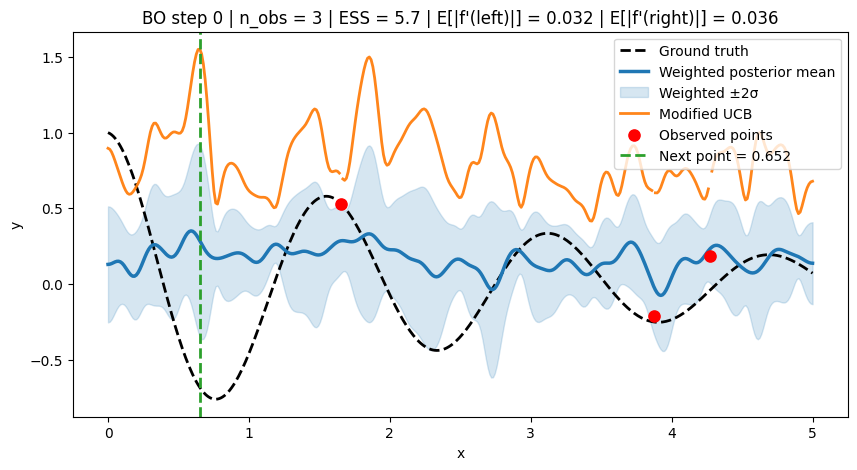

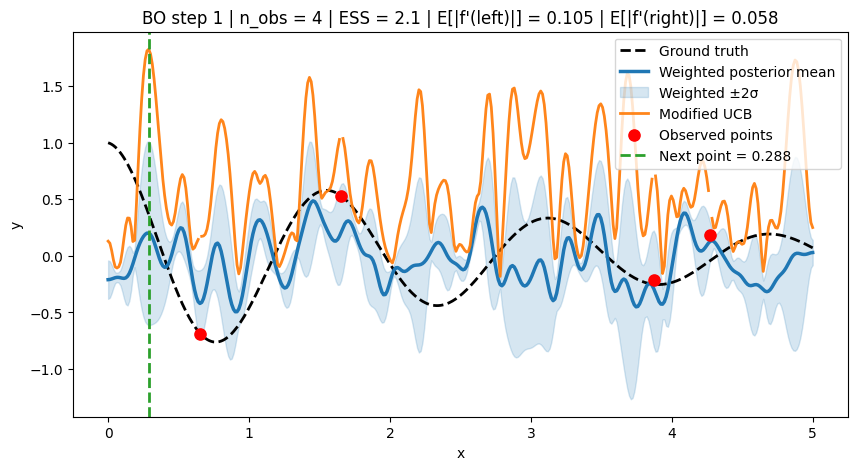

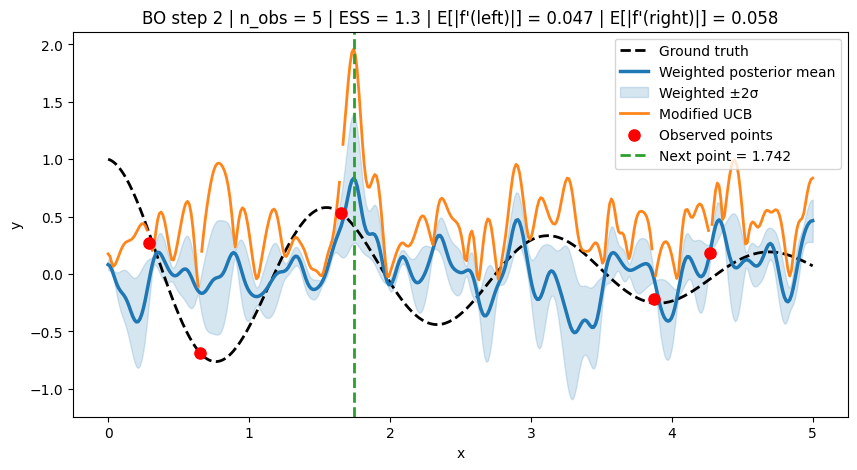

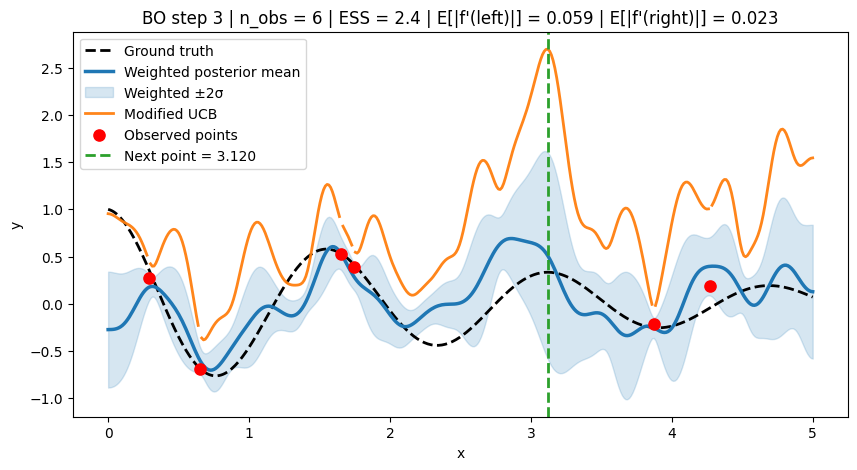

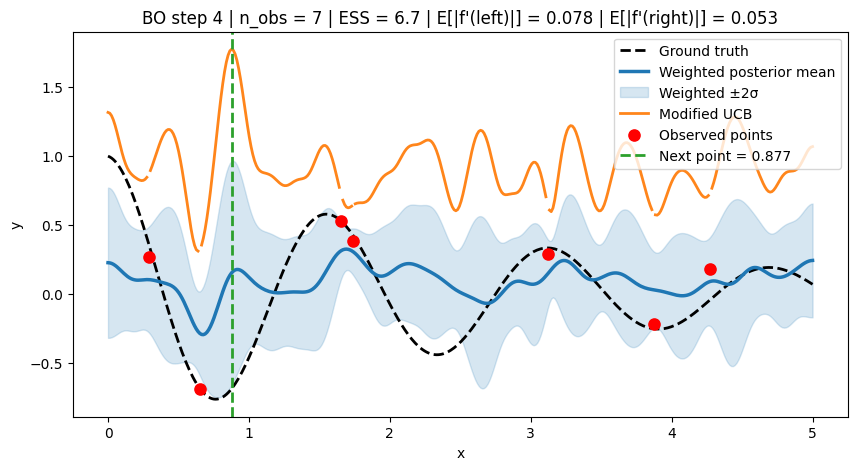

...

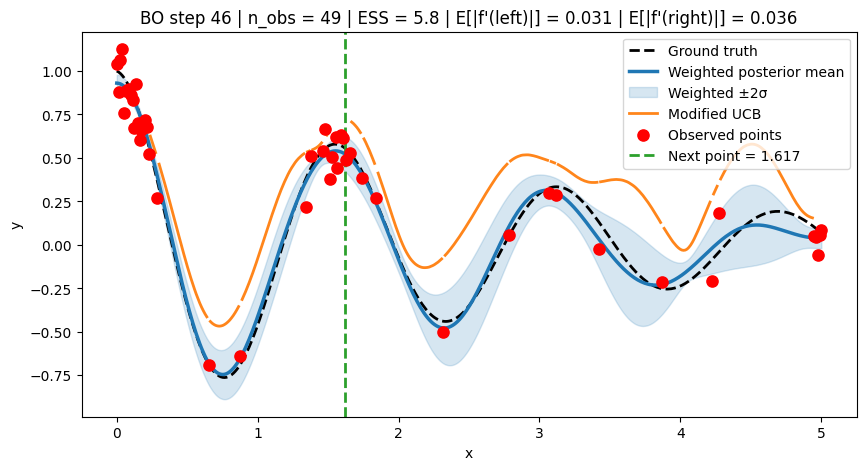

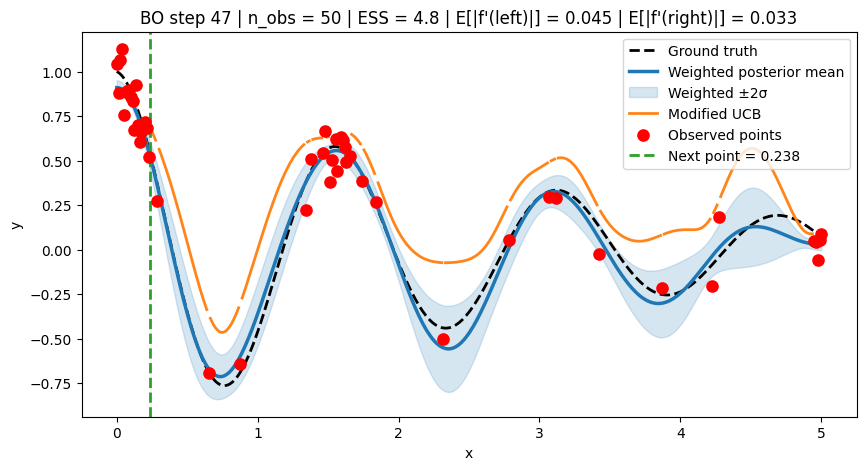

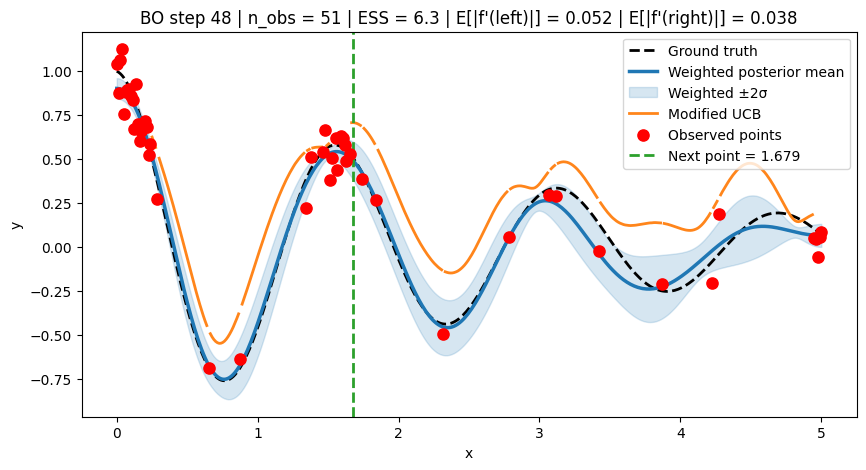

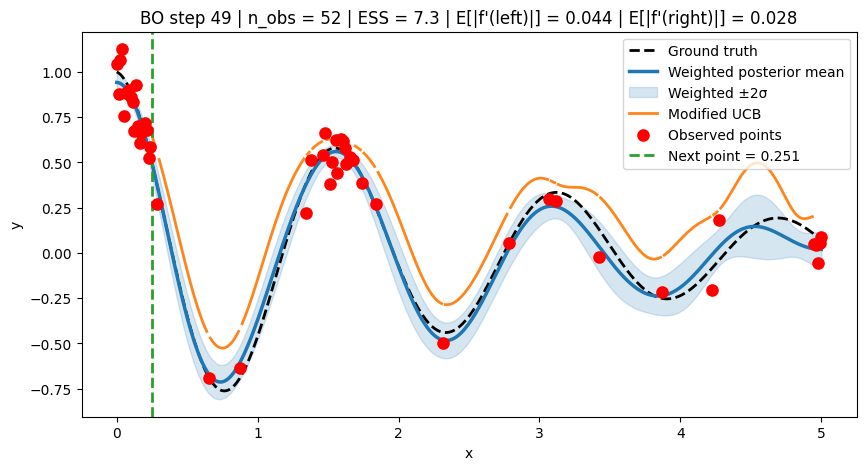

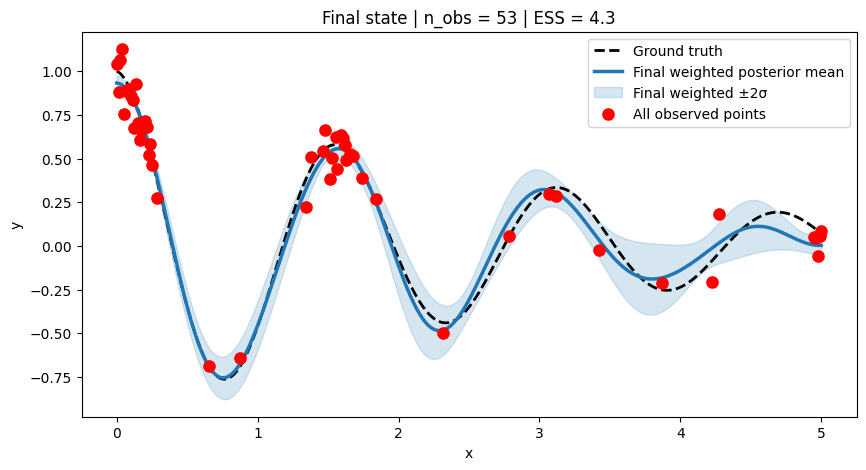

In [28]:
!pip install gpytorch -q

import numpy as np
import torch
import gpytorch
import matplotlib.pyplot as plt

# ============================================================
# Reproducibility / device
# ============================================================

torch.manual_seed(0)
np.random.seed(0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype = torch.float64
torch.set_default_dtype(dtype)

print(f"Using device: {device}")

# ============================================================
# Ground-truth function
# ============================================================

'''
def f1(x, A=1.0, tau=1.6, offset=0.05):
    """
    Monotonic increasing function with saturation.
    """
    return offset - A * (1.0 - np.exp(-x / tau))
'''

def f1(x, A=1.0, gamma=0.35, w=4.0, offset=0.0):
    """
    Damped oscillatory response.
    """
    return offset + A * np.exp(-gamma * x) * np.cos(w * x)

# ============================================================
# GP model
# ============================================================

class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super().__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel()
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

def train_gp(model, likelihood, train_x, train_y, lr=0.05, training_iter=200):
    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    losses = []
    for _ in range(training_iter):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

    return losses

# ============================================================
# Weighted posterior from derivative constraints
# ============================================================

def weighted_posterior_from_edge_derivatives(
    model,
    test_x,
    x_grid,
    n_posterior_samples=1024,
    slope_tol_left=0.05,
    slope_tol_right=0.05,
):
    """
    Sample posterior functions, estimate left/right edge derivatives,
    and reweight samples to prefer near-zero derivatives at both ends.

    Returns
    -------
    samples_np : (M, n_grid)
    weights : (M,)
    weighted_mean : (n_grid,)
    weighted_std : (n_grid,)
    d_left : (M,)
    d_right : (M,)
    ess : float
    """
    model.eval()

    with torch.no_grad():
        posterior = model(test_x)
        samples = posterior.sample(torch.Size([n_posterior_samples]))

    samples_np = samples.detach().cpu().numpy()
    dx = x_grid[1] - x_grid[0]

    # 3-point one-sided finite differences at both edges
    d_left = (-3 * samples_np[:, 0] + 4 * samples_np[:, 1] - samples_np[:, 2]) / (2 * dx)
    d_right = (3 * samples_np[:, -1] - 4 * samples_np[:, -2] + samples_np[:, -3]) / (2 * dx)

    # Stable log-weights
    logw = (
        -0.5 * (d_left / slope_tol_left) ** 2
        -0.5 * (d_right / slope_tol_right) ** 2
    )
    logw = logw - np.max(logw)
    raw_weights = np.exp(logw)

    if raw_weights.sum() <= 0:
        raw_weights = np.ones_like(raw_weights)

    weights = raw_weights / raw_weights.sum()

    weighted_mean = np.sum(weights[:, None] * samples_np, axis=0)
    weighted_var = np.sum(
        weights[:, None] * (samples_np - weighted_mean[None, :]) ** 2,
        axis=0
    )
    weighted_std = np.sqrt(np.maximum(weighted_var, 0.0))

    ess = 1.0 / np.sum(weights ** 2)

    return samples_np, weights, weighted_mean, weighted_std, d_left, d_right, ess

# ============================================================
# Acquisition
# ============================================================

def modified_ucb(mean, std, beta=2.0):
    return mean + beta * std

def choose_next_idx_from_ucb(ucb, observed_idx):
    """
    Choose argmax(UCB) among unobserved grid locations.
    """
    ucb_masked = ucb.copy()
    ucb_masked[np.array(observed_idx, dtype=int)] = -np.inf
    next_idx = int(np.argmax(ucb_masked))
    return next_idx, ucb_masked

# ============================================================
# Plotting
# ============================================================

def plot_bo_step(
    step,
    x_grid,
    f_true,
    x_obs,
    y_obs,
    weighted_mean,
    weighted_std,
    ucb,
    next_idx,
    ess,
    d_left,
    d_right,
    weights,
):
    plt.figure(figsize=(10, 5))

    plt.plot(x_grid, f_true(x_grid), "k--", linewidth=2, label="Ground truth")
    plt.plot(x_grid, weighted_mean, color="tab:blue", linewidth=2.5, label="Weighted posterior mean")
    plt.fill_between(
        x_grid,
        weighted_mean - 2 * weighted_std,
        weighted_mean + 2 * weighted_std,
        color="tab:blue",
        alpha=0.18,
        label="Weighted ±2σ",
    )

    plt.plot(x_grid, ucb, color="tab:orange", linewidth=2, alpha=0.95, label="Modified UCB")
    plt.scatter(x_obs, y_obs, color="red", s=65, zorder=4, label="Observed points")
    plt.axvline(
        x_grid[next_idx],
        color="tab:green",
        linestyle="--",
        linewidth=2,
        label=f"Next point = {x_grid[next_idx]:.3f}",
    )

    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(
        f"BO step {step} | n_obs = {len(x_obs)} | ESS = {ess:.1f} | "
        f"E[|f'(left)|] = {np.sum(weights*np.abs(d_left)):.3f} | "
        f"E[|f'(right)|] = {np.sum(weights*np.abs(d_right)):.3f}"
    )
    plt.legend()
    plt.show()

# ============================================================
# Main BO loop
# ============================================================

# ---- configuration ----
f_true = f1

x_grid = np.linspace(0.0, 5.0, 400)
test_x = torch.tensor(x_grid, dtype=dtype, device=device).unsqueeze(-1)

N_INIT = 3
N_BO_STEPS = 50
NOISE_STD = 0.10              # set > 0 if you want noisy observations
M_POSTERIOR = 4096
BETA = 4.0

SLOPE_TOL_LEFT = 0.05
SLOPE_TOL_RIGHT = 0.05

TRAIN_LR = 0.05
TRAIN_ITERS = 200

# ---- initial observations sampled from the grid ----
init_idx = np.sort(np.random.choice(len(x_grid), size=N_INIT, replace=False))
x_obs = x_grid[init_idx].copy()
y_obs = f_true(x_obs) + np.random.normal(0.0, NOISE_STD, size=N_INIT)
observed_idx = list(init_idx)

print("Initial indices:", observed_idx)
print("Initial x:", x_obs)

# ---- BO iterations ----
for step in range(N_BO_STEPS):
    train_x = torch.tensor(x_obs, dtype=dtype, device=device).unsqueeze(-1)
    train_y = torch.tensor(y_obs, dtype=dtype, device=device)

    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = ExactGPModel(train_x, train_y, likelihood)

    model = model.to(device=device, dtype=dtype)
    likelihood = likelihood.to(device=device, dtype=dtype)

    _ = train_gp(
        model,
        likelihood,
        train_x,
        train_y,
        lr=TRAIN_LR,
        training_iter=TRAIN_ITERS,
    )

    samples_np, weights, weighted_mean, weighted_std, d_left, d_right, ess = (
        weighted_posterior_from_edge_derivatives(
            model=model,
            test_x=test_x,
            x_grid=x_grid,
            n_posterior_samples=M_POSTERIOR,
            slope_tol_left=SLOPE_TOL_LEFT,
            slope_tol_right=SLOPE_TOL_RIGHT,
        )
    )

    ucb = modified_ucb(weighted_mean, weighted_std, beta=BETA)
    next_idx, ucb_masked = choose_next_idx_from_ucb(ucb, observed_idx)

    plot_bo_step(
        step=step,
        x_grid=x_grid,
        f_true=f_true,
        x_obs=x_obs,
        y_obs=y_obs,
        weighted_mean=weighted_mean,
        weighted_std=weighted_std,
        ucb=ucb_masked,
        next_idx=next_idx,
        ess=ess,
        d_left=d_left,
        d_right=d_right,
        weights=weights,
    )

    # acquire next point
    x_new = x_grid[next_idx]
    y_new = f_true(x_new) + np.random.normal(0.0, NOISE_STD)

    x_obs = np.append(x_obs, x_new)
    y_obs = np.append(y_obs, y_new)
    observed_idx.append(next_idx)

# ============================================================
# Final summary plot
# ============================================================

train_x = torch.tensor(x_obs, dtype=dtype, device=device).unsqueeze(-1)
train_y = torch.tensor(y_obs, dtype=dtype, device=device)

likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = ExactGPModel(train_x, train_y, likelihood).to(device=device, dtype=dtype)
likelihood = likelihood.to(device=device, dtype=dtype)

_ = train_gp(model, likelihood, train_x, train_y, lr=TRAIN_LR, training_iter=TRAIN_ITERS)

samples_np, weights, weighted_mean, weighted_std, d_left, d_right, ess = (
    weighted_posterior_from_edge_derivatives(
        model=model,
        test_x=test_x,
        x_grid=x_grid,
        n_posterior_samples=M_POSTERIOR,
        slope_tol_left=SLOPE_TOL_LEFT,
        slope_tol_right=SLOPE_TOL_RIGHT,
    )
)

plt.figure(figsize=(10, 5))
plt.plot(x_grid, f_true(x_grid), "k--", linewidth=2, label="Ground truth")
plt.plot(x_grid, weighted_mean, color="tab:blue", linewidth=2.5, label="Final weighted posterior mean")
plt.fill_between(
    x_grid,
    weighted_mean - 2 * weighted_std,
    weighted_mean + 2 * weighted_std,
    color="tab:blue",
    alpha=0.18,
    label="Final weighted ±2σ",
)
plt.scatter(x_obs, y_obs, color="red", s=65, zorder=4, label="All observed points")
plt.xlabel("x")
plt.ylabel("y")
plt.title(f"Final state | n_obs = {len(x_obs)} | ESS = {ess:.1f}")
plt.legend()
plt.show()

## Optimization constraint by differential equation

Using device: cuda
Initial indices: [np.int64(132), np.int64(309), np.int64(341)]
Initial x: [1.65413534 3.87218045 4.27318296]


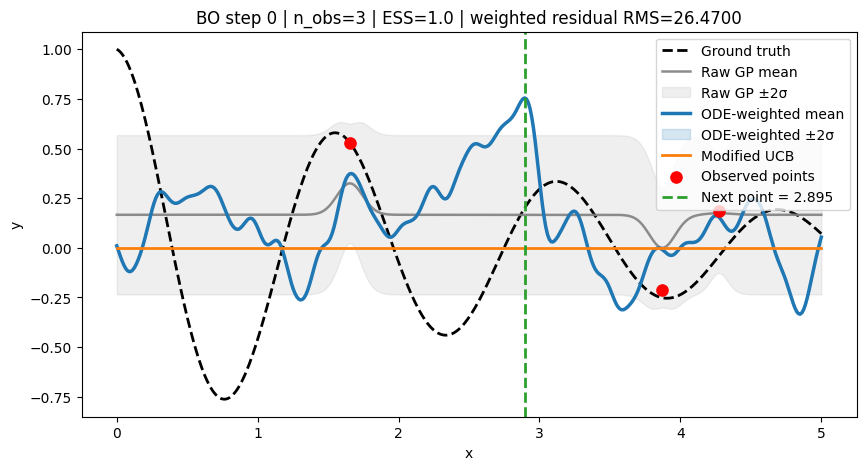

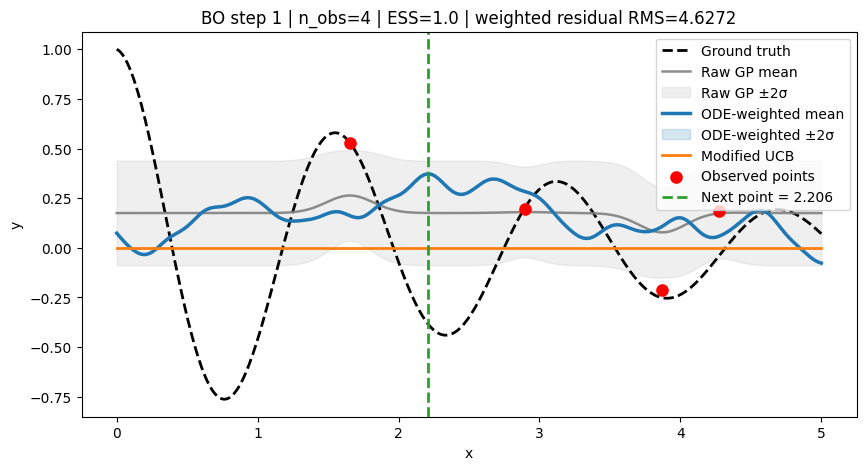

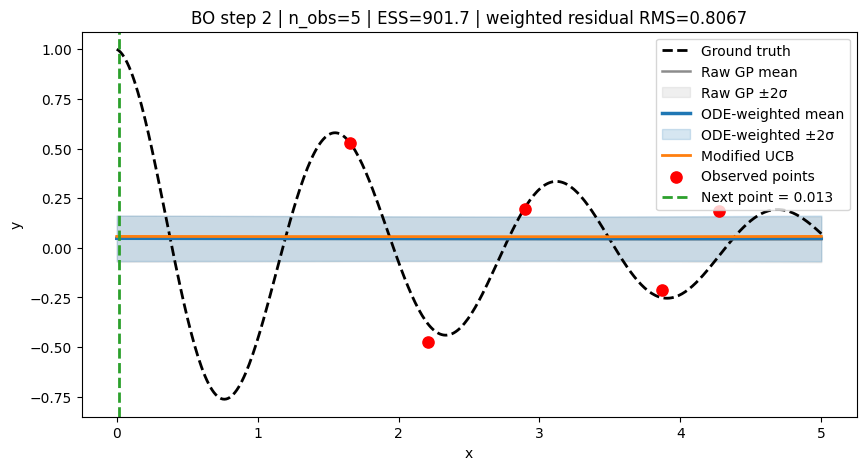

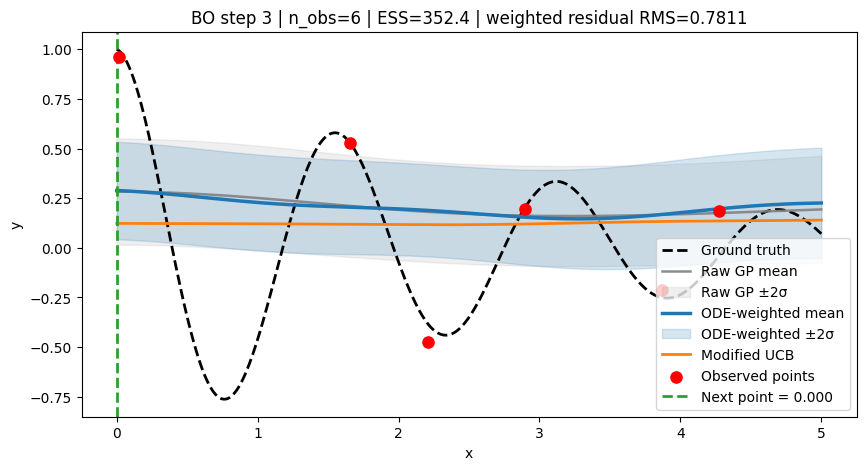

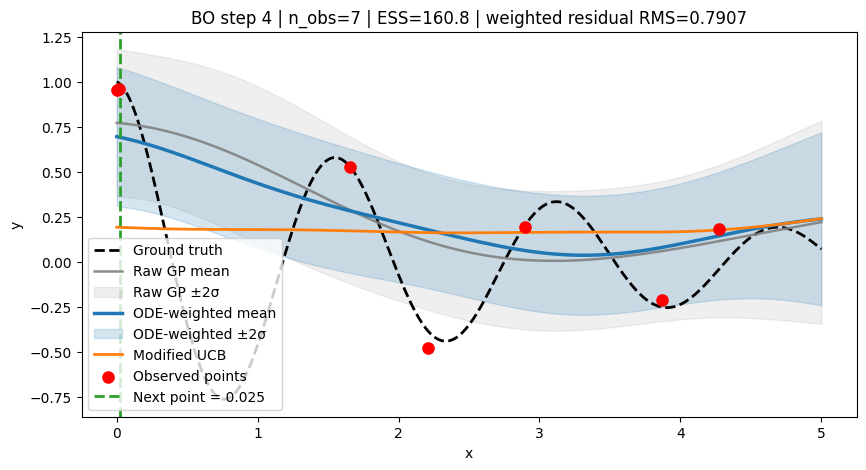

...

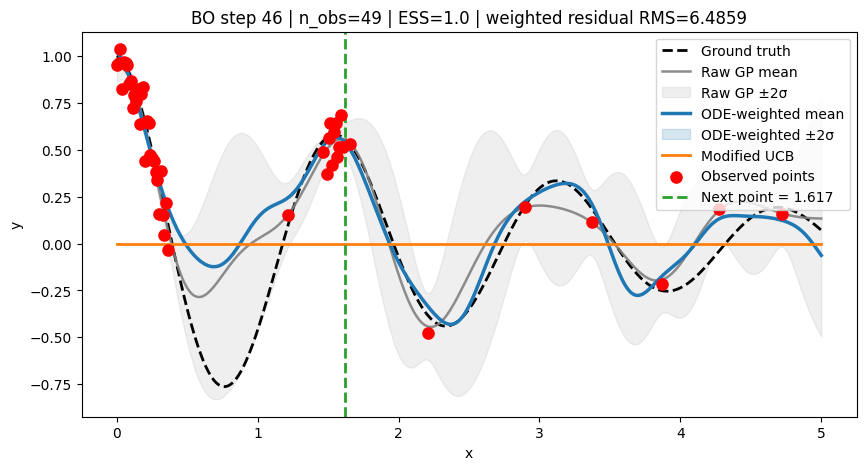

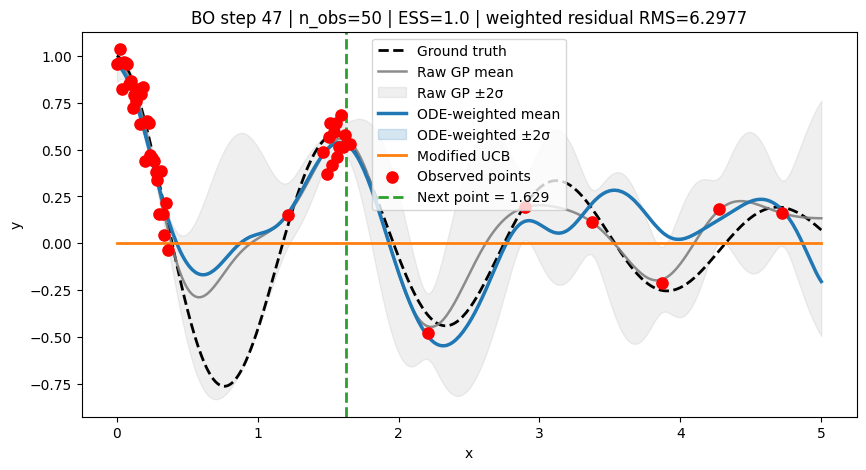

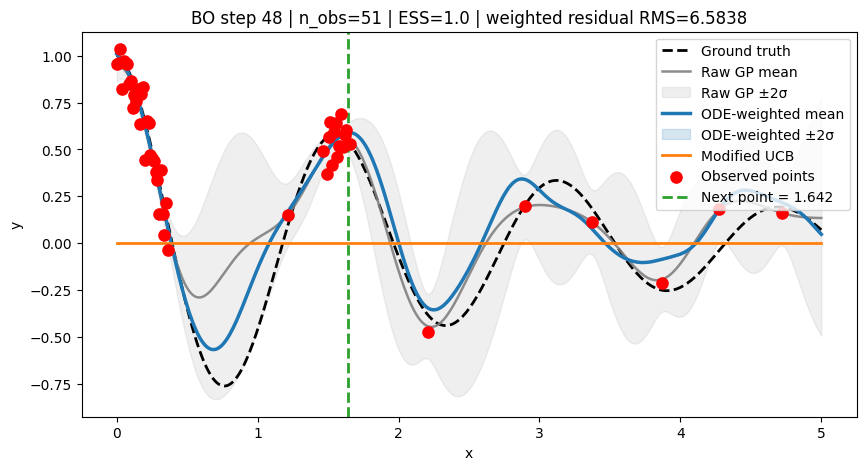

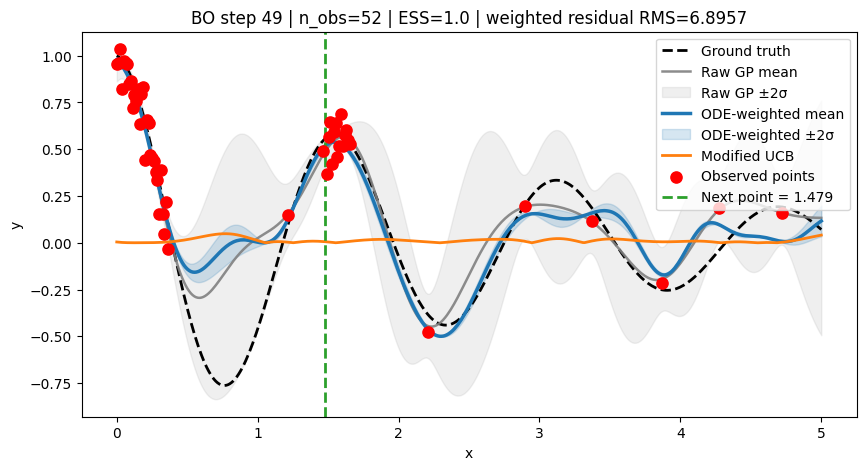

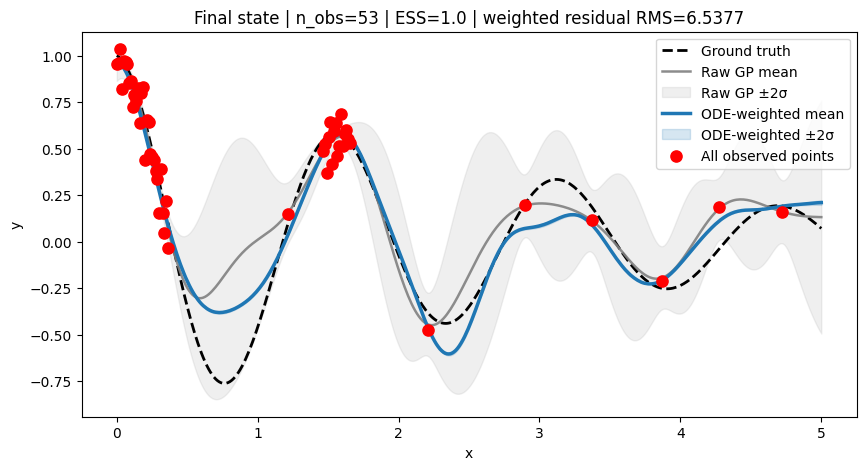

In [34]:
!pip install gpytorch -q

import numpy as np
import torch
import gpytorch
import matplotlib.pyplot as plt

# ============================================================
# Reproducibility / device
# ============================================================

torch.manual_seed(0)
np.random.seed(0)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
dtype = torch.float64
torch.set_default_dtype(dtype)

print(f"Using device: {device}")

# ============================================================
# Ground-truth functions
# ============================================================

def f1(x, A=1.0, tau=1.6, offset=0.05):
    return offset + A * (1.0 - np.exp(-x / tau))

def f2(x, L=1.0, x0=2.5, k=3.0, offset=0.05):
    return offset + L / (1 + np.exp(-k * (x - x0)))

def f3(x, x0=2.5, gamma=0.25, A=1.0, offset=0.05):
    return offset + A * gamma**2 / ((x - x0)**2 + gamma**2)

def f4(x, A=1.0, gamma=0.35, w=4.0, offset=0.0):
    return offset + A * np.exp(-gamma * x) * np.cos(w * x)

# ============================================================
# GP model
# ============================================================

class ExactGPModel(gpytorch.models.ExactGP):
    def __init__(self, train_x, train_y, likelihood):
        super().__init__(train_x, train_y, likelihood)
        self.mean_module = gpytorch.means.ConstantMean()
        self.covar_module = gpytorch.kernels.ScaleKernel(
            gpytorch.kernels.RBFKernel()
        )

    def forward(self, x):
        mean_x = self.mean_module(x)
        covar_x = self.covar_module(x)
        return gpytorch.distributions.MultivariateNormal(mean_x, covar_x)

def train_gp(model, likelihood, train_x, train_y, lr=0.05, training_iter=200):
    model.train()
    likelihood.train()

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    mll = gpytorch.mlls.ExactMarginalLogLikelihood(likelihood, model)

    losses = []
    for _ in range(training_iter):
        optimizer.zero_grad()
        output = model(train_x)
        loss = -mll(output, train_y)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())

    return losses

# ============================================================
# ODE-constrained posterior weighting
# ============================================================

def weighted_posterior_from_ode(
    model,
    test_x,
    x_grid,
    n_posterior_samples=1024,
    ode_tol=0.20,
    forcing_mode="cos3x",
    weight_mode="gaussian",
):
    """
    Sample posterior functions and reweight them by how well they satisfy

        y''(x) - y'(x) + forcing(x) = 0

    Parameters
    ----------
    model : trained GP model
    test_x : torch tensor, shape (n_grid, 1)
    x_grid : numpy array, shape (n_grid,)
    n_posterior_samples : int
    ode_tol : float
        Tolerance on RMS residual. Smaller => stronger ODE preference.
    forcing_mode : str
        "cos3x"  -> forcing = cos(3x)
        "cos3w_constant" -> forcing = cos(3.0), constant
    weight_mode : str
        "gaussian" or "sharp" or "uniform"

    Returns
    -------
    samples_np : (M, n_grid)
    weights : (M,)
    weighted_mean : (n_grid,)
    weighted_std : (n_grid,)
    residual_rms : (M,)
    ess : float
    gp_mean : (n_grid,)
    gp_std : (n_grid,)
    """
    model.eval()

    with torch.no_grad(), gpytorch.settings.fast_pred_var():
        posterior = model(test_x)
        gp_mean = posterior.mean.detach().cpu().numpy()
        gp_std = posterior.stddev.detach().cpu().numpy()

    with torch.no_grad():
        posterior = model(test_x)
        samples = posterior.sample(torch.Size([n_posterior_samples]))

    samples_np = samples.detach().cpu().numpy()   # shape: (M, n_grid)

    dx = x_grid[1] - x_grid[0]

    # First and second derivatives along x
    dy = np.gradient(samples_np, dx, axis=1, edge_order=2)
    d2y = np.gradient(dy, dx, axis=1, edge_order=2)

    if forcing_mode == "cos3x":
        forcing = np.cos(3.0 * x_grid)[None, :]
    elif forcing_mode == "cos3w_constant":
        forcing = np.cos(3.0) * np.ones((1, len(x_grid)))
    else:
        raise ValueError(f"Unknown forcing_mode: {forcing_mode}")

    residual = d2y - dy + forcing
    residual_rms = np.sqrt(np.mean(residual**2, axis=1))

    if weight_mode == "uniform":
        raw_weights = np.ones_like(residual_rms)
    elif weight_mode == "gaussian":
        logw = -0.5 * (residual_rms / max(ode_tol, 1e-12))**2
        logw = logw - np.max(logw)
        raw_weights = np.exp(logw)
    elif weight_mode == "sharp":
        logw = -(residual_rms / max(ode_tol, 1e-12))
        logw = logw - np.max(logw)
        raw_weights = np.exp(logw)
    else:
        raise ValueError(f"Unknown weight_mode: {weight_mode}")

    if raw_weights.sum() <= 0:
        raw_weights = np.ones_like(raw_weights)

    weights = raw_weights / raw_weights.sum()

    weighted_mean = np.sum(weights[:, None] * samples_np, axis=0)
    weighted_var = np.sum(
        weights[:, None] * (samples_np - weighted_mean[None, :])**2,
        axis=0
    )
    weighted_std = np.sqrt(np.maximum(weighted_var, 0.0))

    ess = 1.0 / np.sum(weights**2)

    return (
        samples_np,
        weights,
        weighted_mean,
        weighted_std,
        residual_rms,
        ess,
        gp_mean,
        gp_std,
    )

# ============================================================
# Acquisition
# ============================================================

def modified_ucb(mean, std, beta=2.0):
    return mean + beta * std

def choose_next_idx_from_ucb(ucb, observed_idx):
    ucb_masked = ucb.copy()
    ucb_masked[np.array(observed_idx, dtype=int)] = -np.inf
    next_idx = int(np.argmax(ucb_masked))
    return next_idx, ucb_masked

# ============================================================
# Plotting
# ============================================================

def plot_bo_step(
    step,
    x_grid,
    f_true,
    x_obs,
    y_obs,
    constrained_mean,
    constrained_std,
    gp_mean,
    gp_std,
    ucb,
    next_idx,
    ess,
    residual_rms,
    weights,
):
    plt.figure(figsize=(10, 5))

    plt.plot(x_grid, f_true(x_grid), "k--", linewidth=2, label="Ground truth")

    # raw GP
    plt.plot(x_grid, gp_mean, color="gray", linewidth=1.8, alpha=0.9, label="Raw GP mean")
    plt.fill_between(
        x_grid,
        gp_mean - 2 * gp_std,
        gp_mean + 2 * gp_std,
        color="gray",
        alpha=0.12,
        label="Raw GP ±2σ",
    )

    # constrained posterior
    plt.plot(x_grid, constrained_mean, color="tab:blue", linewidth=2.5, label="ODE-weighted mean")
    plt.fill_between(
        x_grid,
        constrained_mean - 2 * constrained_std,
        constrained_mean + 2 * constrained_std,
        color="tab:blue",
        alpha=0.18,
        label="ODE-weighted ±2σ",
    )

    # acquisition
    plt.plot(x_grid, ucb, color="tab:orange", linewidth=2, label="Modified UCB")
    plt.scatter(x_obs, y_obs, color="red", s=65, zorder=5, label="Observed points")
    plt.axvline(
        x_grid[next_idx],
        color="tab:green",
        linestyle="--",
        linewidth=2,
        label=f"Next point = {x_grid[next_idx]:.3f}",
    )

    plt.xlabel("x")
    plt.ylabel("y")
    plt.title(
        f"BO step {step} | n_obs={len(x_obs)} | ESS={ess:.1f} | "
        f"weighted residual RMS={np.sum(weights * residual_rms):.4f}"
    )
    plt.legend()
    plt.show()

# ============================================================
# Main BO loop
# ============================================================

# ---- configuration ----
f_true = f4                  # choose ground truth
x_grid = np.linspace(0.0, 5.0, 400)
test_x = torch.tensor(x_grid, dtype=dtype, device=device).unsqueeze(-1)

N_INIT = 3
N_BO_STEPS = 50
NOISE_STD = 0.10

M_POSTERIOR = 1024
BETA = 2.0

# ODE weighting settings
ODE_TOL = 0.20
FORCING_MODE = "cos3x"       # change to "cos3w_constant" if you literally meant cos(3w)
WEIGHT_MODE = "gaussian"

TRAIN_LR = 0.05
TRAIN_ITERS = 200

# ---- initial points from the grid ----
init_idx = np.sort(np.random.choice(len(x_grid), size=N_INIT, replace=False))
x_obs = x_grid[init_idx].copy()
y_obs = f_true(x_obs) + np.random.normal(0.0, NOISE_STD, size=N_INIT)
observed_idx = list(init_idx)

print("Initial indices:", observed_idx)
print("Initial x:", x_obs)

# ---- BO iterations ----
for step in range(N_BO_STEPS):
    train_x = torch.tensor(x_obs, dtype=dtype, device=device).unsqueeze(-1)
    train_y = torch.tensor(y_obs, dtype=dtype, device=device)

    likelihood = gpytorch.likelihoods.GaussianLikelihood()
    model = ExactGPModel(train_x, train_y, likelihood)

    model = model.to(device=device, dtype=dtype)
    likelihood = likelihood.to(device=device, dtype=dtype)

    _ = train_gp(
        model,
        likelihood,
        train_x,
        train_y,
        lr=TRAIN_LR,
        training_iter=TRAIN_ITERS,
    )

    (
        samples_np,
        weights,
        constrained_mean,
        constrained_std,
        residual_rms,
        ess,
        gp_mean,
        gp_std,
    ) = weighted_posterior_from_ode(
        model=model,
        test_x=test_x,
        x_grid=x_grid,
        n_posterior_samples=M_POSTERIOR,
        ode_tol=ODE_TOL,
        forcing_mode=FORCING_MODE,
        weight_mode=WEIGHT_MODE,
    )

    # Modified UCB built from ODE-weighted posterior
    ucb = modified_ucb(constrained_mean, constrained_std, beta=BETA)
    next_idx, ucb_masked = choose_next_idx_from_ucb(ucb, observed_idx)

    plot_bo_step(
        step=step,
        x_grid=x_grid,
        f_true=f_true,
        x_obs=x_obs,
        y_obs=y_obs,
        constrained_mean=constrained_mean,
        constrained_std=constrained_std,
        gp_mean=gp_mean,
        gp_std=gp_std,
        ucb=constrained_std, #ucb_masked,
        next_idx=next_idx,
        ess=ess,
        residual_rms=residual_rms,
        weights=weights,
    )

    # acquire next point
    x_new = x_grid[next_idx]
    y_new = f_true(x_new) + np.random.normal(0.0, NOISE_STD)

    x_obs = np.append(x_obs, x_new)
    y_obs = np.append(y_obs, y_new)
    observed_idx.append(next_idx)

# ============================================================
# Final state
# ============================================================

train_x = torch.tensor(x_obs, dtype=dtype, device=device).unsqueeze(-1)
train_y = torch.tensor(y_obs, dtype=dtype, device=device)

likelihood = gpytorch.likelihoods.GaussianLikelihood()
model = ExactGPModel(train_x, train_y, likelihood).to(device=device, dtype=dtype)
likelihood = likelihood.to(device=device, dtype=dtype)

_ = train_gp(model, likelihood, train_x, train_y, lr=TRAIN_LR, training_iter=TRAIN_ITERS)

(
    samples_np,
    weights,
    constrained_mean,
    constrained_std,
    residual_rms,
    ess,
    gp_mean,
    gp_std,
) = weighted_posterior_from_ode(
    model=model,
    test_x=test_x,
    x_grid=x_grid,
    n_posterior_samples=M_POSTERIOR,
    ode_tol=ODE_TOL,
    forcing_mode=FORCING_MODE,
    weight_mode=WEIGHT_MODE,
)

plt.figure(figsize=(10, 5))
plt.plot(x_grid, f_true(x_grid), "k--", linewidth=2, label="Ground truth")
plt.plot(x_grid, gp_mean, color="gray", linewidth=1.8, alpha=0.9, label="Raw GP mean")
plt.fill_between(
    x_grid,
    gp_mean - 2 * gp_std,
    gp_mean + 2 * gp_std,
    color="gray",
    alpha=0.12,
    label="Raw GP ±2σ",
)
plt.plot(x_grid, constrained_mean, color="tab:blue", linewidth=2.5, label="ODE-weighted mean")
plt.fill_between(
    x_grid,
    constrained_mean - 2 * constrained_std,
    constrained_mean + 2 * constrained_std,
    color="tab:blue",
    alpha=0.18,
    label="ODE-weighted ±2σ",
)
plt.scatter(x_obs, y_obs, color="red", s=65, zorder=5, label="All observed points")
plt.xlabel("x")
plt.ylabel("y")
plt.title(
    f"Final state | n_obs={len(x_obs)} | ESS={ess:.1f} | "
    f"weighted residual RMS={np.sum(weights * residual_rms):.4f}"
)
plt.legend()
plt.show()

# Build latent model

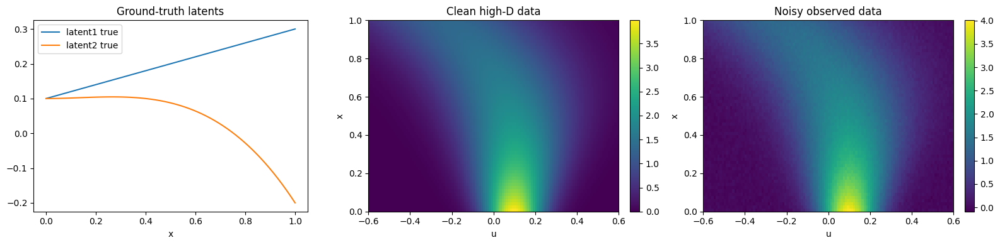

In [35]:
# ============================================================
# Cell 1: generate synthetic data from two latent functions
# ============================================================

import numpy as np
import torch
import matplotlib.pyplot as plt

torch.set_default_dtype(torch.float64)
torch.manual_seed(0)
np.random.seed(0)

# x-domain where latents live
N = 60
x = np.linspace(0.0, 1.0, N)

# ground-truth latent functions (unknown to the model)
lg1_true = 0.1 + 0.2 * x
lg2_true = 0.1 + 0.2 * x**2 - 0.5 * x**3

# high-dimensional observation axis
D = 120
u = np.linspace(-0.6, 0.6, D)

def gaussian_profile(u, width, center):
    return np.exp(-0.5 * ((u - center) / width)**2) / (np.sqrt(2 * np.pi) * width)

# generate data: at each x_i, observe a Gaussian profile over u
Y_clean = np.stack([gaussian_profile(u, w, c) for w, c in zip(lg1_true, lg2_true)], axis=0)

noise_std = 0.03
Y = Y_clean + noise_std * np.random.randn(*Y_clean.shape)

# plots
fig, ax = plt.subplots(1, 3, figsize=(16, 4))

ax[0].plot(x, lg1_true, label="latent1 true")
ax[0].plot(x, lg2_true, label="latent2 true")
ax[0].set_xlabel("x")
ax[0].set_title("Ground-truth latents")
ax[0].legend()

im1 = ax[1].imshow(
    Y_clean,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1].set_xlabel("u")
ax[1].set_ylabel("x")
ax[1].set_title("Clean high-D data")
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

im2 = ax[2].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[2].set_xlabel("u")
ax[2].set_ylabel("x")
ax[2].set_title("Noisy observed data")
plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

step    0 | loss=1422636.313 | data=1423246.495 | prior1=-305.091 | prior2=-305.091
step  399 | loss=2866.260 | data=3465.707 | prior1=-299.420 | prior2=-300.026


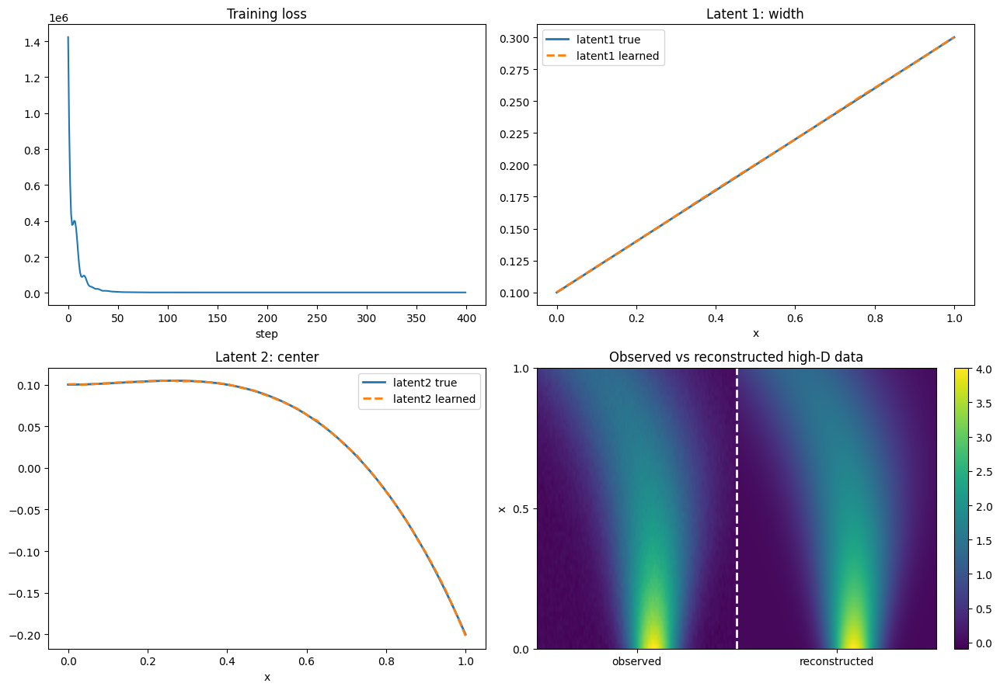

In [38]:
# ============================================================
# Cell 2: latent GP model + training + latent reconstruction
# ============================================================

import math
import torch.nn as nn
import torch.nn.functional as F

# convert data to torch
x_t = torch.tensor(x)
u_t = torch.tensor(u)
Y_t = torch.tensor(Y)

def inverse_softplus(y):
    # stable inverse of softplus for positive y
    return y + torch.log(-torch.expm1(-y))

def rbf_kernel(x, amplitude=1.0, lengthscale=0.2, jitter=1e-6):
    x1 = x[:, None]
    x2 = x[None, :]
    sqdist = (x1 - x2)**2
    K = amplitude**2 * torch.exp(-0.5 * sqdist / (lengthscale**2))
    K = K + jitter * torch.eye(len(x), dtype=x.dtype)
    return K

def gp_prior_nll(f, mean, K):
    """
    Negative log-density of f ~ N(mean, K)
    """
    centered = f - mean
    L = torch.linalg.cholesky(K)
    alpha = torch.cholesky_solve(centered[:, None], L).squeeze(-1)
    n = f.numel()
    return (
        0.5 * centered.dot(alpha)
        + torch.sum(torch.log(torch.diagonal(L)))
        + 0.5 * n * math.log(2 * math.pi)
    )

class LatentGaussianDecoderMAP(nn.Module):
    def __init__(
        self,
        x,
        u,
        obs_noise_std=0.03,
        amp1=0.5,
        ell1=0.25,
        amp2=0.5,
        ell2=0.25,
    ):
        super().__init__()
        self.register_buffer("x", x)
        self.register_buffer("u", u)
        self.obs_noise_std = obs_noise_std

        N = len(x)

        # latent 1 is width -> keep it positive through softplus
        init_width = 0.15 * torch.ones(N, dtype=x.dtype)
        self.raw_latent1 = nn.Parameter(inverse_softplus(init_width.clone()))

        # latent 2 is center -> unconstrained
        self.latent2 = nn.Parameter(torch.zeros(N, dtype=x.dtype))

        # learnable constant offsets for GP priors
        self.mean1_raw = nn.Parameter(inverse_softplus(torch.tensor(0.15, dtype=x.dtype)))
        self.mean2 = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))

        # fixed GP covariance matrices for this simple example
        K1 = rbf_kernel(x, amplitude=amp1, lengthscale=ell1)
        K2 = rbf_kernel(x, amplitude=amp2, lengthscale=ell2)

        self.register_buffer("K1", K1)
        self.register_buffer("K2", K2)

    def decode(self):
        width = F.softplus(self.raw_latent1) + 1e-4
        center = self.latent2

        z = (self.u[None, :] - center[:, None]) / width[:, None]
        Y_hat = torch.exp(-0.5 * z**2) / (math.sqrt(2 * math.pi) * width[:, None])

        return Y_hat, width, center

    def loss(self, Y):
        Y_hat, width, center = self.decode()

        # Gaussian observation model with fixed noise
        resid = (Y - Y_hat) / self.obs_noise_std
        data_nll = 0.5 * torch.sum(resid**2)

        # GP priors on latent trajectories
        prior1 = gp_prior_nll(self.raw_latent1, self.mean1_raw, self.K1)
        prior2 = gp_prior_nll(self.latent2, self.mean2, self.K2)

        total = data_nll + prior1 + prior2
        return total, {
            "data_nll": data_nll.item(),
            "prior1": prior1.item(),
            "prior2": prior2.item(),
        }

# build model
model = LatentGaussianDecoderMAP(
    x=x_t,
    u=u_t,
    obs_noise_std=noise_std,
    amp1=0.4,
    ell1=0.22,
    amp2=0.4,
    ell2=0.22,
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.03)

# training
n_steps = 400
loss_history = []

for step in range(n_steps):
    optimizer.zero_grad()
    loss, parts = model.loss(Y_t)
    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    if step % 500 == 0 or step == n_steps - 1:
        print(
            f"step {step:4d} | "
            f"loss={loss.item():.3f} | "
            f"data={parts['data_nll']:.3f} | "
            f"prior1={parts['prior1']:.3f} | "
            f"prior2={parts['prior2']:.3f}"
        )

# extract learned latents
with torch.no_grad():
    Y_hat, latent1_learned, latent2_learned = model.decode()

latent1_learned = latent1_learned.detach().numpy()
latent2_learned = latent2_learned.detach().numpy()
Y_hat_np = Y_hat.cpu().numpy()

# plots
fig, ax = plt.subplots(2, 2, figsize=(13, 9))

ax[0, 0].plot(loss_history)
ax[0, 0].set_title("Training loss")
ax[0, 0].set_xlabel("step")

ax[0, 1].plot(x, lg1_true, label="latent1 true", linewidth=2)
ax[0, 1].plot(x, latent1_learned, "--", label="latent1 learned", linewidth=2)
ax[0, 1].set_xlabel("x")
ax[0, 1].set_title("Latent 1: width")
ax[0, 1].legend()

ax[1, 0].plot(x, lg2_true, label="latent2 true", linewidth=2)
ax[1, 0].plot(x, latent2_learned, "--", label="latent2 learned", linewidth=2)
ax[1, 0].set_xlabel("x")
ax[1, 0].set_title("Latent 2: center")
ax[1, 0].legend()

# compare observed and reconstructed data
im = ax[1, 1].imshow(
    np.hstack([Y, Y_hat_np]),
    aspect="auto",
    origin="lower",
    extent=[0, 2, x.min(), x.max()]
)
ax[1, 1].axvline(1.0, color="white", linestyle="--", linewidth=2)
ax[1, 1].set_yticks([0.0, 0.5, 1.0])
ax[1, 1].set_xticks([0.5, 1.5])
ax[1, 1].set_xticklabels(["observed", "reconstructed"])
ax[1, 1].set_ylabel("x")
ax[1, 1].set_title("Observed vs reconstructed high-D data")
plt.colorbar(im, ax=ax[1, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

step    0 | loss=2004101.115 | data=1990289.365 | prior1=664.318 | prior2=13147.427 | wd=0.005 | noise=0.0500
step  500 | loss=-19002.454 | data=-18444.614 | prior1=-278.455 | prior2=-279.401 | wd=0.015 | noise=0.0681
step 1000 | loss=-20432.279 | data=-19884.349 | prior1=-275.989 | prior2=-271.957 | wd=0.016 | noise=0.0544
step 1500 | loss=-21702.169 | data=-21152.987 | prior1=-273.317 | prior2=-275.882 | wd=0.017 | noise=0.0411
step 2000 | loss=-22485.823 | data=-21947.632 | prior1=-269.183 | prior2=-269.027 | wd=0.018 | noise=0.0325
step 2500 | loss=-22639.431 | data=-22097.741 | prior1=-268.393 | prior2=-273.316 | wd=0.019 | noise=0.0292
step 3000 | loss=-22660.965 | data=-22122.931 | prior1=-267.245 | prior2=-270.807 | wd=0.019 | noise=0.0283
step 3500 | loss=-22683.295 | data=-22140.419 | prior1=-271.750 | prior2=-271.146 | wd=0.019 | noise=0.0282
step 4000 | loss=-22699.153 | data=-22157.059 | prior1=-269.250 | prior2=-272.864 | wd=0.020 | noise=0.0282
step 4500 | loss=-22725.91

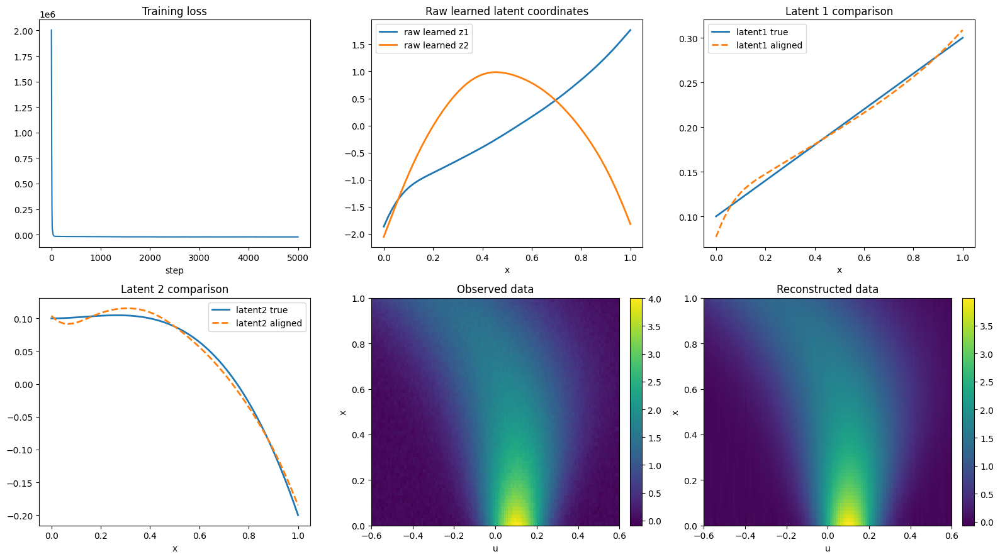

In [39]:
# ============================================================
# Cell 2: latent GP model with learned neural decoder 2 -> 10 -> D
# ============================================================

import math
import torch.nn as nn
import torch.nn.functional as F

# convert data to torch
x_t = torch.tensor(x)
Y_t = torch.tensor(Y)

def rbf_kernel(x, amplitude=1.0, lengthscale=0.2, jitter=1e-6):
    x1 = x[:, None]
    x2 = x[None, :]
    sqdist = (x1 - x2) ** 2
    K = amplitude**2 * torch.exp(-0.5 * sqdist / (lengthscale**2))
    K = K + jitter * torch.eye(len(x), dtype=x.dtype)
    return K

def gp_prior_nll(f, mean, K):
    """
    Negative log-density of f ~ N(mean, K)
    """
    centered = f - mean
    L = torch.linalg.cholesky(K)
    alpha = torch.cholesky_solve(centered[:, None], L).squeeze(-1)
    n = f.numel()
    return (
        0.5 * centered.dot(alpha)
        + torch.sum(torch.log(torch.diagonal(L)))
        + 0.5 * n * math.log(2 * math.pi)
    )

def pca_init_2d(Y_np):
    """
    Simple SVD/PCA initialization for latent coordinates.
    """
    Yc = Y_np - Y_np.mean(axis=0, keepdims=True)
    U, S, Vt = np.linalg.svd(Yc, full_matrices=False)
    Z0 = U[:, :2] * S[:2]
    Z0 = (Z0 - Z0.mean(axis=0, keepdims=True)) / (Z0.std(axis=0, keepdims=True) + 1e-8)
    return Z0

class LatentGPMLPDecoderMAP(nn.Module):
    def __init__(
        self,
        x,
        data_dim,
        latent_init,
        gp_amp1=1.0,
        gp_ls1=0.18,
        gp_amp2=1.0,
        gp_ls2=0.18,
        obs_noise_std_init=0.05,
        decoder_weight_decay=1e-4,
    ):
        super().__init__()

        self.register_buffer("x", x)
        self.data_dim = data_dim
        self.decoder_weight_decay = decoder_weight_decay

        N = len(x)

        # latent trajectories over x
        self.latent = nn.Parameter(torch.tensor(latent_init, dtype=x.dtype))  # shape (N,2)

        # GP prior means
        self.mean1 = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))
        self.mean2 = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))

        # fixed GP covariance matrices
        K1 = rbf_kernel(x, amplitude=gp_amp1, lengthscale=gp_ls1)
        K2 = rbf_kernel(x, amplitude=gp_amp2, lengthscale=gp_ls2)

        self.register_buffer("K1", K1)
        self.register_buffer("K2", K2)

        # learnable decoder: 2 -> 10 -> D
        self.decoder = nn.Sequential(
            nn.Linear(2, 10),
            nn.Tanh(),
            nn.Linear(10, data_dim)
        )

        # learnable observation noise
        self.log_obs_noise_std = nn.Parameter(torch.log(torch.tensor(obs_noise_std_init, dtype=x.dtype)))

    def decode(self):
        return self.decoder(self.latent)

    def loss(self, Y):
        Y_hat = self.decode()

        obs_noise_std = torch.exp(self.log_obs_noise_std) + 1e-6
        resid = (Y - Y_hat) / obs_noise_std

        # Gaussian likelihood
        data_nll = (
            0.5 * torch.sum(resid**2)
            + Y.numel() * torch.log(obs_noise_std)
        )

        # GP priors on the two latent trajectories
        prior1 = gp_prior_nll(self.latent[:, 0], self.mean1, self.K1)
        prior2 = gp_prior_nll(self.latent[:, 1], self.mean2, self.K2)

        # mild weight decay on decoder
        wd = torch.tensor(0.0, dtype=Y.dtype)
        for p in self.decoder.parameters():
            wd = wd + torch.sum(p**2)
        wd = self.decoder_weight_decay * wd

        total = data_nll + prior1 + prior2 + wd

        return total, {
            "data_nll": data_nll.item(),
            "prior1": prior1.item(),
            "prior2": prior2.item(),
            "weight_decay": wd.item(),
            "obs_noise_std": obs_noise_std.item(),
        }

# ------------------------------------------------------------
# Build model
# ------------------------------------------------------------

latent_init = pca_init_2d(Y)

model = LatentGPMLPDecoderMAP(
    x=x_t,
    data_dim=D,
    latent_init=latent_init,
    gp_amp1=1.0,
    gp_ls1=0.20,
    gp_amp2=1.0,
    gp_ls2=0.20,
    obs_noise_std_init=0.05,
    decoder_weight_decay=1e-4,
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.02)

# ------------------------------------------------------------
# Train
# ------------------------------------------------------------

n_steps = 5000
loss_history = []

for step in range(n_steps):
    optimizer.zero_grad()
    loss, parts = model.loss(Y_t)
    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    if step % 500 == 0 or step == n_steps - 1:
        print(
            f"step {step:4d} | "
            f"loss={loss.item():.3f} | "
            f"data={parts['data_nll']:.3f} | "
            f"prior1={parts['prior1']:.3f} | "
            f"prior2={parts['prior2']:.3f} | "
            f"wd={parts['weight_decay']:.3f} | "
            f"noise={parts['obs_noise_std']:.4f}"
        )

# ------------------------------------------------------------
# Extract learned quantities
# ------------------------------------------------------------

with torch.no_grad():
    Y_hat = model.decode().cpu().numpy()
    Z_learn = model.latent.cpu().numpy()

# ------------------------------------------------------------
# Affine alignment to truth for synthetic evaluation only
# This is NOT part of the model. It is only to compare shapes.
# ------------------------------------------------------------

Z_aug = np.concatenate([Z_learn, np.ones((N, 1))], axis=1)   # shape (N,3)
T_true = np.stack([lg1_true, lg2_true], axis=1)              # shape (N,2)

A, _, _, _ = np.linalg.lstsq(Z_aug, T_true, rcond=None)
Z_aligned = Z_aug @ A

latent1_aligned = Z_aligned[:, 0]
latent2_aligned = Z_aligned[:, 1]

# ------------------------------------------------------------
# Plot
# ------------------------------------------------------------

fig, ax = plt.subplots(2, 3, figsize=(16, 9))

# training loss
ax[0, 0].plot(loss_history)
ax[0, 0].set_title("Training loss")
ax[0, 0].set_xlabel("step")

# raw learned latents
ax[0, 1].plot(x, Z_learn[:, 0], label="raw learned z1", linewidth=2)
ax[0, 1].plot(x, Z_learn[:, 1], label="raw learned z2", linewidth=2)
ax[0, 1].set_xlabel("x")
ax[0, 1].set_title("Raw learned latent coordinates")
ax[0, 1].legend()

# latent1 comparison after affine alignment
ax[0, 2].plot(x, lg1_true, label="latent1 true", linewidth=2)
ax[0, 2].plot(x, latent1_aligned, "--", label="latent1 aligned", linewidth=2)
ax[0, 2].set_xlabel("x")
ax[0, 2].set_title("Latent 1 comparison")
ax[0, 2].legend()

# latent2 comparison after affine alignment
ax[1, 0].plot(x, lg2_true, label="latent2 true", linewidth=2)
ax[1, 0].plot(x, latent2_aligned, "--", label="latent2 aligned", linewidth=2)
ax[1, 0].set_xlabel("x")
ax[1, 0].set_title("Latent 2 comparison")
ax[1, 0].legend()

# observed data
im1 = ax[1, 1].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1, 1].set_xlabel("u")
ax[1, 1].set_ylabel("x")
ax[1, 1].set_title("Observed data")
plt.colorbar(im1, ax=ax[1, 1], fraction=0.046, pad=0.04)

# reconstructed data
im2 = ax[1, 2].imshow(
    Y_hat,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1, 2].set_xlabel("u")
ax[1, 2].set_ylabel("x")
ax[1, 2].set_title("Reconstructed data")
plt.colorbar(im2, ax=ax[1, 2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# Slightly more exciting

N total = 100
N train = 60
N gap   = 40


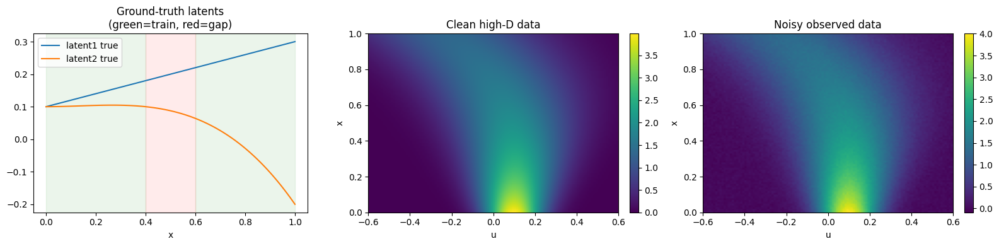

In [43]:
# ============================================================
# Cell 1: generate synthetic data
# ============================================================

import numpy as np
import torch
import matplotlib.pyplot as plt

torch.set_default_dtype(torch.float64)
torch.manual_seed(0)
np.random.seed(0)

# ------------------------------------------------------------
# x domain and true latent functions
# ------------------------------------------------------------

N = 100
x = np.linspace(0.0, 1.0, N)

lg1_true = 0.1 + 0.2 * x
lg2_true = 0.1 + 0.2 * x**2 - 0.5 * x**3

# ------------------------------------------------------------
# high-dimensional curve axis
# ------------------------------------------------------------

D = 120
u = np.linspace(-0.6, 0.6, D)

def gaussian_profile(u, width, center):
    return np.exp(-0.5 * ((u - center) / width)**2) / (np.sqrt(2 * np.pi) * width)

# clean data
Y_clean = np.stack(
    [gaussian_profile(u, w, c) for w, c in zip(lg1_true, lg2_true)],
    axis=0
)

noise_std = 0.03
Y = Y_clean + noise_std * np.random.randn(*Y_clean.shape)

# ------------------------------------------------------------
# training mask: only [0,0.4] and [0.6,1]
# ------------------------------------------------------------

train_mask = (x <= 0.2) | (x >= 0.6)
test_mask = ~train_mask

train_idx = np.where(train_mask)[0]
test_idx = np.where(test_mask)[0]

print(f"N total = {N}")
print(f"N train = {train_mask.sum()}")
print(f"N gap   = {test_mask.sum()}")

# ------------------------------------------------------------
# plots
# ------------------------------------------------------------

fig, ax = plt.subplots(1, 3, figsize=(16, 4))

ax[0].plot(x, lg1_true, label="latent1 true")
ax[0].plot(x, lg2_true, label="latent2 true")
ax[0].axvspan(0.0, 0.4, color="green", alpha=0.08)
ax[0].axvspan(0.6, 1.0, color="green", alpha=0.08)
ax[0].axvspan(0.4, 0.6, color="red", alpha=0.08)
ax[0].set_xlabel("x")
ax[0].set_title("Ground-truth latents\n(green=train, red=gap)")
ax[0].legend()

im1 = ax[1].imshow(
    Y_clean,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1].set_xlabel("u")
ax[1].set_ylabel("x")
ax[1].set_title("Clean high-D data")
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

im2 = ax[2].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[2].set_xlabel("u")
ax[2].set_ylabel("x")
ax[2].set_title("Noisy observed data")
plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

step    0 | loss=3740362.929 | data=1894758.170 | kl1=908330.856 | kl2=937273.899 | wd=0.005 | noise=0.0500
step  500 | loss=10614.709 | data=-15999.772 | kl1=13342.979 | kl2=13271.492 | wd=0.010 | noise=0.0706
step 1000 | loss=-8550.836 | data=-17737.191 | kl1=4634.102 | kl2=4552.242 | wd=0.010 | noise=0.0677
step 1500 | loss=-14211.773 | data=-18884.580 | kl1=2367.177 | kl2=2305.619 | wd=0.011 | noise=0.0611
step 2000 | loss=-16748.196 | data=-19676.927 | kl1=1501.629 | kl2=1427.091 | wd=0.011 | noise=0.0530
step 2500 | loss=-18303.233 | data=-20308.549 | kl1=1049.931 | kl2=955.374 | wd=0.011 | noise=0.0453
step 3000 | loss=-18967.131 | data=-20476.162 | kl1=790.078 | kl2=718.942 | wd=0.011 | noise=0.0398
step 3500 | loss=-19485.917 | data=-20664.386 | kl1=617.956 | kl2=560.502 | wd=0.012 | noise=0.0357
step 4000 | loss=-20742.563 | data=-21641.549 | kl1=462.010 | kl2=436.963 | wd=0.012 | noise=0.0335
step 4500 | loss=-20286.310 | data=-21060.483 | kl1=392.585 | kl2=381.577 | wd=0.01

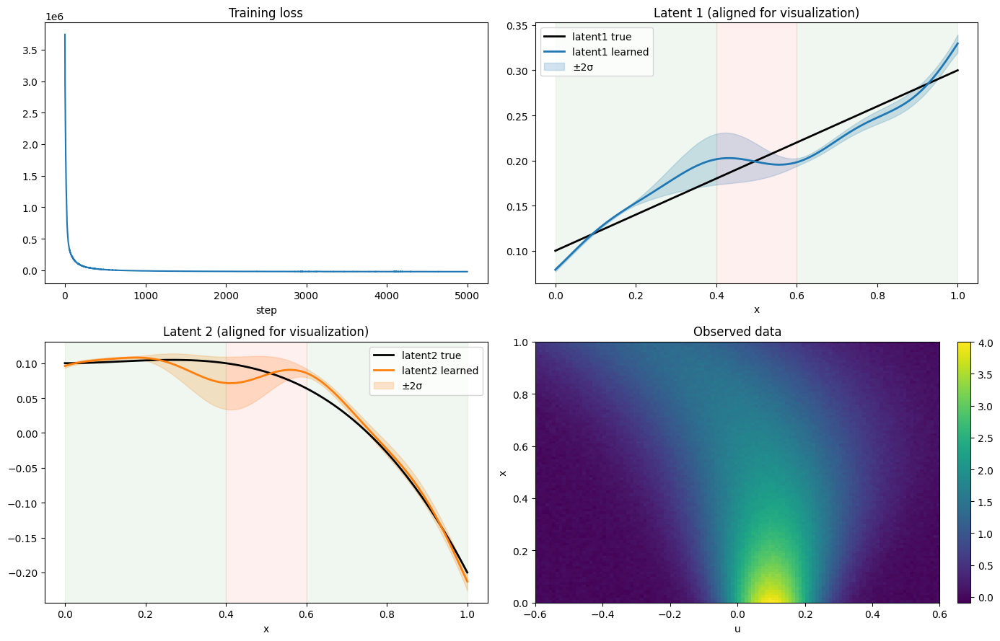

In [44]:
# ============================================================
# Cell 2: variational latent GP model + learned decoder
# ============================================================

import math
import torch.nn as nn
import torch.nn.functional as F

# ------------------------------------------------------------
# convert to torch
# ------------------------------------------------------------

x_t = torch.tensor(x)
Y_t = torch.tensor(Y)
train_mask_t = torch.tensor(train_mask, dtype=torch.bool)

# ------------------------------------------------------------
# helpers
# ------------------------------------------------------------

def rbf_kernel(x, amplitude=1.0, lengthscale=0.2, jitter=1e-6):
    x1 = x[:, None]
    x2 = x[None, :]
    sqdist = (x1 - x2) ** 2
    K = amplitude**2 * torch.exp(-0.5 * sqdist / (lengthscale**2))
    K = K + jitter * torch.eye(len(x), dtype=x.dtype)
    return K

def pca_init_2d(Y_np):
    Yc = Y_np - Y_np.mean(axis=0, keepdims=True)
    U, S, Vt = np.linalg.svd(Yc, full_matrices=False)
    Z0 = U[:, :2] * S[:2]
    Z0 = (Z0 - Z0.mean(axis=0, keepdims=True)) / (Z0.std(axis=0, keepdims=True) + 1e-8)
    return Z0

def build_cholesky(raw_L):
    """
    Turn an unconstrained square matrix into a valid lower-triangular Cholesky factor.
    """
    L = torch.tril(raw_L)
    diag = torch.diagonal(L)
    diag_pos = F.softplus(diag) + 1e-5
    L = L - torch.diag(diag) + torch.diag(diag_pos)
    return L

def gaussian_kl(mu_q, L_q, mu_p, K_p):
    """
    KL( q || p ) where:
      q = N(mu_q, S_q),  S_q = L_q L_q^T
      p = N(mu_p, K_p)
    """
    n = mu_q.numel()

    # Cholesky of prior covariance
    Lp = torch.linalg.cholesky(K_p)

    # trace(Kp^{-1} Sq)
    S_q = L_q @ L_q.T
    Kp_inv_Sq = torch.cholesky_solve(S_q, Lp)
    trace_term = torch.trace(Kp_inv_Sq)

    # quadratic term
    delta = (mu_p - mu_q)[:, None]
    quad = (delta.T @ torch.cholesky_solve(delta, Lp)).squeeze()

    # log determinants
    logdet_p = 2.0 * torch.sum(torch.log(torch.diagonal(Lp)))
    logdet_q = 2.0 * torch.sum(torch.log(torch.diagonal(L_q)))

    kl = 0.5 * (trace_term + quad - n + logdet_p - logdet_q)
    return kl

class VariationalLatentGPMLP(nn.Module):
    def __init__(
        self,
        x,
        data_dim,
        latent_init,
        gp_amp1=1.0,
        gp_ls1=0.18,
        gp_amp2=1.0,
        gp_ls2=0.18,
        obs_noise_std_init=0.05,
        decoder_weight_decay=1e-4,
    ):
        super().__init__()

        self.register_buffer("x", x)
        self.N = len(x)
        self.data_dim = data_dim
        self.decoder_weight_decay = decoder_weight_decay

        # ----------------------------------------------------
        # GP priors p(z1), p(z2)
        # ----------------------------------------------------
        K1 = rbf_kernel(x, amplitude=gp_amp1, lengthscale=gp_ls1)
        K2 = rbf_kernel(x, amplitude=gp_amp2, lengthscale=gp_ls2)

        self.register_buffer("K1", K1)
        self.register_buffer("K2", K2)

        self.mu1_prior = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))
        self.mu2_prior = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))

        # ----------------------------------------------------
        # variational posterior q(z1), q(z2)
        # each is full-covariance Gaussian over all x-values
        # ----------------------------------------------------
        latent_init = torch.tensor(latent_init, dtype=x.dtype)

        self.mu1_q = nn.Parameter(latent_init[:, 0].clone())
        self.mu2_q = nn.Parameter(latent_init[:, 1].clone())

        # initialize near-diagonal posterior covariance
        raw_L1 = 0.01 * torch.randn(self.N, self.N, dtype=x.dtype)
        raw_L2 = 0.01 * torch.randn(self.N, self.N, dtype=x.dtype)

        raw_L1 = torch.tril(raw_L1)
        raw_L2 = torch.tril(raw_L2)

        raw_L1 = raw_L1 - torch.diag(torch.diagonal(raw_L1)) + torch.diag(torch.full((self.N,), -2.0, dtype=x.dtype))
        raw_L2 = raw_L2 - torch.diag(torch.diagonal(raw_L2)) + torch.diag(torch.full((self.N,), -2.0, dtype=x.dtype))

        self.raw_L1_q = nn.Parameter(raw_L1)
        self.raw_L2_q = nn.Parameter(raw_L2)

        # ----------------------------------------------------
        # learned decoder 2 -> 10 -> D
        # ----------------------------------------------------
        self.decoder = nn.Sequential(
            nn.Linear(2, 10),
            nn.Tanh(),
            nn.Linear(10, data_dim)
        )

        # observation noise
        self.log_obs_noise_std = nn.Parameter(torch.log(torch.tensor(obs_noise_std_init, dtype=x.dtype)))

    def sample_latents(self, n_mc=1):
        """
        Sample latent trajectories from q(z1) and q(z2).
        Returns:
          z1_samples: (n_mc, N)
          z2_samples: (n_mc, N)
        """
        L1 = build_cholesky(self.raw_L1_q)
        L2 = build_cholesky(self.raw_L2_q)

        eps1 = torch.randn(n_mc, self.N, dtype=self.x.dtype)
        eps2 = torch.randn(n_mc, self.N, dtype=self.x.dtype)

        z1 = self.mu1_q[None, :] + eps1 @ L1.T
        z2 = self.mu2_q[None, :] + eps2 @ L2.T
        return z1, z2, L1, L2

    def decode_from_latents(self, z1, z2):
        """
        z1, z2 shape (..., N)
        returns decoded Y shape (..., N, D)
        """
        z = torch.stack([z1, z2], dim=-1)  # (..., N, 2)
        yhat = self.decoder(z)             # (..., N, D)
        return yhat

    def elbo_loss(self, Y, train_mask, n_mc=3):
        z1_s, z2_s, L1, L2 = self.sample_latents(n_mc=n_mc)
        Y_hat_s = self.decode_from_latents(z1_s, z2_s)   # (n_mc, N, D)

        obs_noise_std = torch.exp(self.log_obs_noise_std) + 1e-6

        # likelihood only on train interval
        resid = (Y_hat_s[:, train_mask, :] - Y[None, train_mask, :]) / obs_noise_std
        data_nll = 0.5 * torch.mean(torch.sum(resid**2, dim=(1, 2))) + Y[train_mask].numel() * torch.log(obs_noise_std)

        # KLs to GP priors
        mu1_p = self.mu1_prior * torch.ones_like(self.mu1_q)
        mu2_p = self.mu2_prior * torch.ones_like(self.mu2_q)

        kl1 = gaussian_kl(self.mu1_q, L1, mu1_p, self.K1)
        kl2 = gaussian_kl(self.mu2_q, L2, mu2_p, self.K2)

        # mild weight decay on decoder
        wd = torch.tensor(0.0, dtype=Y.dtype)
        for p in self.decoder.parameters():
            wd = wd + torch.sum(p**2)
        wd = self.decoder_weight_decay * wd

        loss = data_nll + kl1 + kl2 + wd

        return loss, {
            "data_nll": data_nll.item(),
            "kl1": kl1.item(),
            "kl2": kl2.item(),
            "wd": wd.item(),
            "obs_noise_std": obs_noise_std.item(),
        }

# ------------------------------------------------------------
# Build model
# ------------------------------------------------------------

latent_init = pca_init_2d(Y)

model = VariationalLatentGPMLP(
    x=x_t,
    data_dim=D,
    latent_init=latent_init,
    gp_amp1=1.0,
    gp_ls1=0.18,
    gp_amp2=1.0,
    gp_ls2=0.18,
    obs_noise_std_init=0.05,
    decoder_weight_decay=1e-4,
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# ------------------------------------------------------------
# Train
# ------------------------------------------------------------

n_steps = 5000
loss_history = []

for step in range(n_steps):
    optimizer.zero_grad()
    loss, parts = model.elbo_loss(Y_t, train_mask_t, n_mc=3)
    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    if step % 500 == 0 or step == n_steps - 1:
        print(
            f"step {step:4d} | "
            f"loss={loss.item():.3f} | "
            f"data={parts['data_nll']:.3f} | "
            f"kl1={parts['kl1']:.3f} | "
            f"kl2={parts['kl2']:.3f} | "
            f"wd={parts['wd']:.3f} | "
            f"noise={parts['obs_noise_std']:.4f}"
        )

# ------------------------------------------------------------
# Posterior summaries
# ------------------------------------------------------------

with torch.no_grad():
    L1 = build_cholesky(model.raw_L1_q)
    L2 = build_cholesky(model.raw_L2_q)

    mu1 = model.mu1_q.cpu().numpy()
    mu2 = model.mu2_q.cpu().numpy()

    var1 = torch.diagonal(L1 @ L1.T).cpu().numpy()
    var2 = torch.diagonal(L2 @ L2.T).cpu().numpy()

    std1 = np.sqrt(np.maximum(var1, 0.0))
    std2 = np.sqrt(np.maximum(var2, 0.0))

    # decoded mean curve using posterior mean latents
    Y_decoded_mean = model.decode_from_latents(
        model.mu1_q[None, :], model.mu2_q[None, :]
    ).squeeze(0).cpu().numpy()

# ------------------------------------------------------------
# Affine alignment of latents for visualization only
# ------------------------------------------------------------

Z_mean = np.stack([mu1, mu2], axis=1)               # (N,2)
Z_aug = np.concatenate([Z_mean, np.ones((N, 1))], axis=1)
T_true = np.stack([lg1_true, lg2_true], axis=1)

# affine map raw_latents -> true_latents for display
A, _, _, _ = np.linalg.lstsq(Z_aug, T_true, rcond=None)
Z_aligned = Z_aug @ A

latent1_aligned = Z_aligned[:, 0]
latent2_aligned = Z_aligned[:, 1]

# propagate uncertainty approximately through the linear part
T_lin = A[:2, :]   # shape (2,2)

var1_aligned = (T_lin[0, 0] ** 2) * var1 + (T_lin[1, 0] ** 2) * var2
var2_aligned = (T_lin[0, 1] ** 2) * var1 + (T_lin[1, 1] ** 2) * var2

std1_aligned = np.sqrt(np.maximum(var1_aligned, 0.0))
std2_aligned = np.sqrt(np.maximum(var2_aligned, 0.0))

# ------------------------------------------------------------
# Plot learned latents + uncertainties
# ------------------------------------------------------------

fig, ax = plt.subplots(2, 2, figsize=(14, 9))

ax[0, 0].plot(loss_history)
ax[0, 0].set_xlabel("step")
ax[0, 0].set_title("Training loss")

# latent 1
ax[0, 1].plot(x, lg1_true, color="black", linewidth=2, label="latent1 true")
ax[0, 1].plot(x, latent1_aligned, color="tab:blue", linewidth=2, label="latent1 learned")
ax[0, 1].fill_between(
    x,
    latent1_aligned - 2 * std1_aligned,
    latent1_aligned + 2 * std1_aligned,
    color="tab:blue",
    alpha=0.2,
    label="±2σ"
)
ax[0, 1].axvspan(0.0, 0.4, color="green", alpha=0.06)
ax[0, 1].axvspan(0.6, 1.0, color="green", alpha=0.06)
ax[0, 1].axvspan(0.4, 0.6, color="red", alpha=0.06)
ax[0, 1].set_xlabel("x")
ax[0, 1].set_title("Latent 1 (aligned for visualization)")
ax[0, 1].legend()

# latent 2
ax[1, 0].plot(x, lg2_true, color="black", linewidth=2, label="latent2 true")
ax[1, 0].plot(x, latent2_aligned, color="tab:orange", linewidth=2, label="latent2 learned")
ax[1, 0].fill_between(
    x,
    latent2_aligned - 2 * std2_aligned,
    latent2_aligned + 2 * std2_aligned,
    color="tab:orange",
    alpha=0.2,
    label="±2σ"
)
ax[1, 0].axvspan(0.0, 0.4, color="green", alpha=0.06)
ax[1, 0].axvspan(0.6, 1.0, color="green", alpha=0.06)
ax[1, 0].axvspan(0.4, 0.6, color="red", alpha=0.06)
ax[1, 0].set_xlabel("x")
ax[1, 0].set_title("Latent 2 (aligned for visualization)")
ax[1, 0].legend()

# observed data
im1 = ax[1, 1].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1, 1].set_xlabel("u")
ax[1, 1].set_ylabel("x")
ax[1, 1].set_title("Observed data")
plt.colorbar(im1, ax=ax[1, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

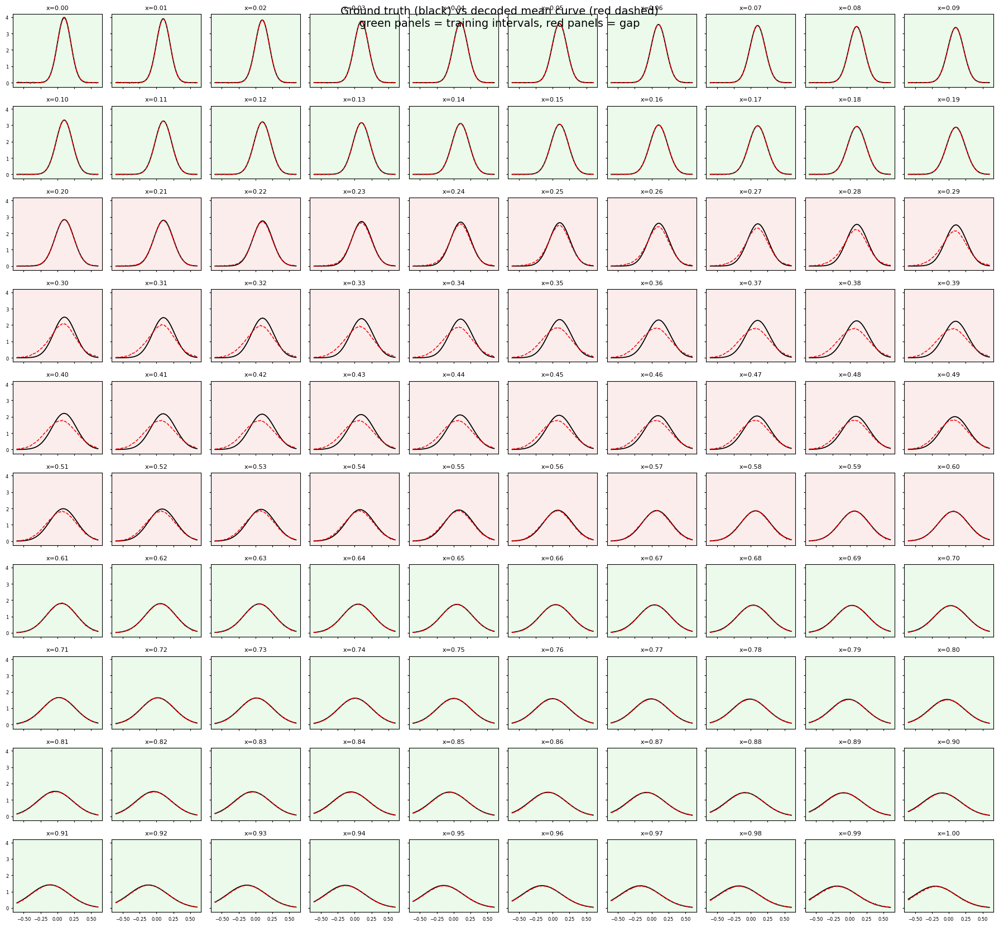

In [45]:
# ============================================================
# Cell 3: 10x10 table of true curve vs decoded curve
# ============================================================

fig, axes = plt.subplots(10, 10, figsize=(18, 18), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    ax.plot(u, Y_clean[i], color="black", linewidth=1.3)
    ax.plot(u, Y_decoded_mean[i], color="red", linestyle="--", linewidth=1.1)

    # light background to indicate where x was observed vs gap
    if train_mask[i]:
        ax.set_facecolor((0.92, 0.98, 0.92))
    else:
        ax.set_facecolor((0.99, 0.93, 0.93))

    ax.set_title(f"x={x[i]:.2f}", fontsize=8)
    ax.tick_params(labelsize=6, length=2)

plt.suptitle(
    "Ground truth (black) vs decoded mean curve (red dashed)\n"
    "green panels = training intervals, red panels = gap",
    fontsize=14,
    y=0.92
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# And even more exciting

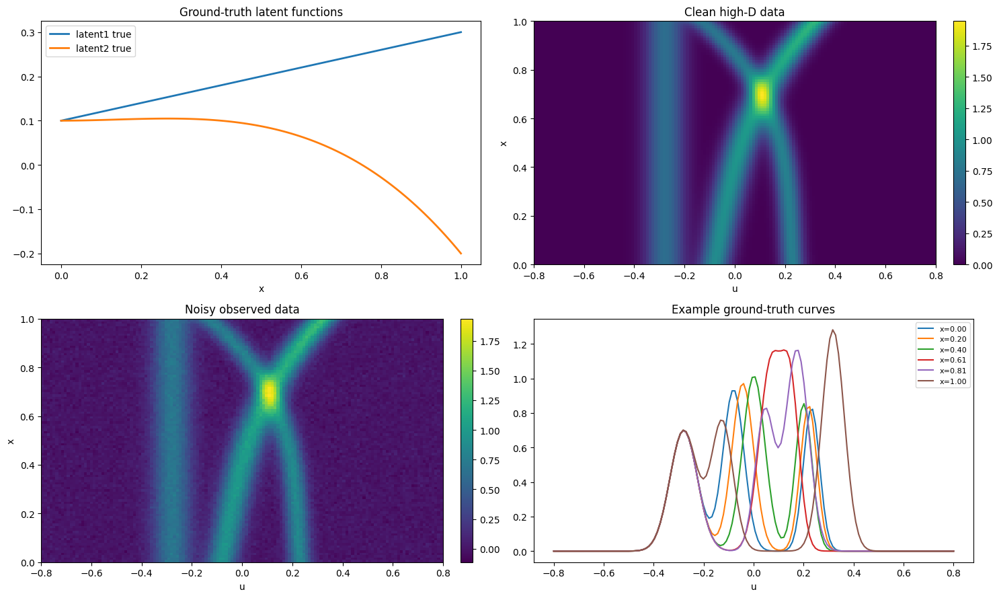

In [47]:
# ============================================================
# Cell 1: generate synthetic data with 3 Gaussians
# ============================================================

import numpy as np
import torch
import matplotlib.pyplot as plt

torch.set_default_dtype(torch.float64)
torch.manual_seed(0)
np.random.seed(0)

# ------------------------------------------------------------
# x-domain and true latents
# ------------------------------------------------------------

N = 100
x = np.linspace(0.0, 1.0, N)

lg1_true = 0.1 + 0.2 * x
lg2_true = 0.1 + 0.2 * x**2 - 0.5 * x**3

# ------------------------------------------------------------
# high-dimensional observation axis
# ------------------------------------------------------------

D = 140
u = np.linspace(-0.8, 0.8, D)

# ------------------------------------------------------------
# cubic polynomial basis in (lg1, lg2)
# ------------------------------------------------------------

def cubic_basis(l1, l2):
    return np.stack([
        np.ones_like(l1),
        l1,
        l2,
        l1**2,
        l1 * l2,
        l2**2,
        l1**3,
        l1**2 * l2,
        l1 * l2**2,
        l2**3,
    ], axis=-1)

def cubic_poly(l1, l2, coeff):
    B = cubic_basis(l1, l2)
    return B @ np.asarray(coeff)

def softplus_np(z):
    return np.log1p(np.exp(-np.abs(z))) + np.maximum(z, 0.0)

def sigmoid_np(z):
    return 1.0 / (1.0 + np.exp(-z))

def gaussian(u, amp, center, width):
    return amp * np.exp(-0.5 * ((u - center) / width) ** 2)

# ------------------------------------------------------------
# fixed Gaussian component (does not change with x)
# ------------------------------------------------------------

A0 = 0.70
c0 = -0.28
w0 = 0.055

# ------------------------------------------------------------
# six parameters of the two moving Gaussians are cubic functions
# of lg1_true and lg2_true
# ------------------------------------------------------------

# component 1
coeff_amp1 = [0.10,  1.50, -0.80,  0.70,  0.45, -0.40,  0.35, -0.20,  0.10,  0.05]
coeff_ctr1 = [-0.10, 0.90, -0.75,  0.20,  0.35, -0.10,  0.15,  0.00,  0.00, -0.12]
coeff_wid1 = [-1.60, 2.80,  1.10, -0.60, -0.20,  0.35,  0.00,  0.00,  0.00,  0.00]

# component 2
coeff_amp2 = [-0.15, 0.60,  1.20,  0.20, -0.55,  0.55,  0.12,  0.00,  0.00,  0.18]
coeff_ctr2 = [0.18, -0.35,  0.85, -0.20,  0.25,  0.10,  0.00,  0.00, -0.08,  0.10]
coeff_wid2 = [-1.40, 0.90, -2.20,  0.30,  0.50,  0.40,  0.00,  0.00,  0.00,  0.00]

amp1 = 0.15 + softplus_np(cubic_poly(lg1_true, lg2_true, coeff_amp1))
ctr1 = cubic_poly(lg1_true, lg2_true, coeff_ctr1)
wid1 = 0.025 + 0.075 * sigmoid_np(cubic_poly(lg1_true, lg2_true, coeff_wid1))

amp2 = 0.12 + softplus_np(cubic_poly(lg1_true, lg2_true, coeff_amp2))
ctr2 = cubic_poly(lg1_true, lg2_true, coeff_ctr2)
wid2 = 0.020 + 0.070 * sigmoid_np(cubic_poly(lg1_true, lg2_true, coeff_wid2))

# ------------------------------------------------------------
# build data
# ------------------------------------------------------------

Y_clean = []
for i in range(N):
    y_i = (
        gaussian(u, A0, c0, w0)
        + gaussian(u, amp1[i], ctr1[i], wid1[i])
        + gaussian(u, amp2[i], ctr2[i], wid2[i])
    )
    Y_clean.append(y_i)

Y_clean = np.stack(Y_clean, axis=0)

noise_std = 0.03
Y = Y_clean + noise_std * np.random.randn(*Y_clean.shape)

# ------------------------------------------------------------
# plots
# ------------------------------------------------------------

fig, ax = plt.subplots(2, 2, figsize=(15, 9))

ax[0, 0].plot(x, lg1_true, label="latent1 true", linewidth=2)
ax[0, 0].plot(x, lg2_true, label="latent2 true", linewidth=2)
ax[0, 0].set_xlabel("x")
ax[0, 0].set_title("Ground-truth latent functions")
ax[0, 0].legend()

im1 = ax[0, 1].imshow(
    Y_clean,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[0, 1].set_xlabel("u")
ax[0, 1].set_ylabel("x")
ax[0, 1].set_title("Clean high-D data")
plt.colorbar(im1, ax=ax[0, 1], fraction=0.046, pad=0.04)

im2 = ax[1, 0].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1, 0].set_xlabel("u")
ax[1, 0].set_ylabel("x")
ax[1, 0].set_title("Noisy observed data")
plt.colorbar(im2, ax=ax[1, 0], fraction=0.046, pad=0.04)

for xi in [0, 20, 40, 60, 80, 99]:
    ax[1, 1].plot(u, Y_clean[xi], label=f"x={x[xi]:.2f}")
ax[1, 1].set_xlabel("u")
ax[1, 1].set_title("Example ground-truth curves")
ax[1, 1].legend(fontsize=8)

plt.tight_layout()
plt.show()

N total = 100
N train = 50
N gap   = 50
step    0 | loss=2076971.201 | data=223076.300 | kl1=912290.943 | kl2=941603.952 | wd=0.006 | noise=0.0500
step  500 | loss=12859.498 | data=-13926.848 | kl1=13283.249 | kl2=13503.089 | wd=0.008 | noise=0.0806
step 1000 | loss=-7635.354 | data=-17228.222 | kl1=4801.571 | kl2=4791.288 | wd=0.008 | noise=0.0607
step 1500 | loss=-15016.508 | data=-20315.433 | kl1=2627.239 | kl2=2671.678 | wd=0.008 | noise=0.0370
step 2000 | loss=-16882.532 | data=-20237.224 | kl1=1620.163 | kl2=1734.521 | wd=0.008 | noise=0.0322
step 2500 | loss=-19057.174 | data=-21255.492 | kl1=1040.429 | kl2=1157.881 | wd=0.009 | noise=0.0300
step 3000 | loss=-19803.377 | data=-21540.359 | kl1=825.821 | kl2=911.151 | wd=0.010 | noise=0.0283
step 3500 | loss=-20572.036 | data=-21868.887 | kl1=593.591 | kl2=703.249 | wd=0.010 | noise=0.0276
step 4000 | loss=-20677.450 | data=-21856.648 | kl1=537.175 | kl2=642.013 | wd=0.011 | noise=0.0271
step 4500 | loss=-21093.171 | data=-22022.5

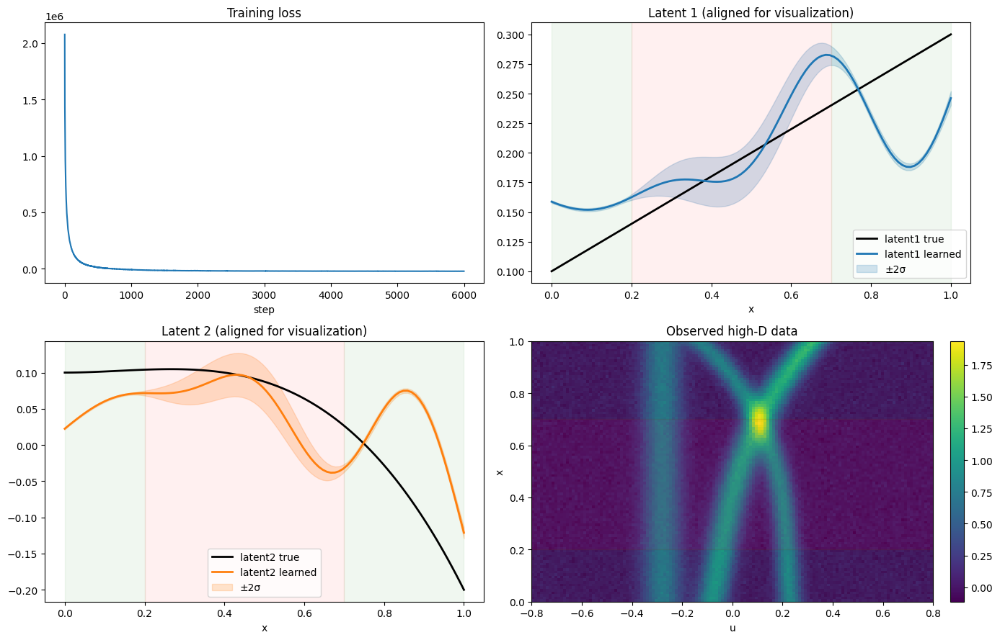

In [50]:
# ============================================================
# Cell 2: variational latent GP model + deeper decoder
# ============================================================

import math
import torch.nn as nn
import torch.nn.functional as F

# ------------------------------------------------------------
# CHANGE THESE TWO NUMBERS TO MOVE THE EXCLUDED INTERVAL
# ------------------------------------------------------------

a = 0.2
b = 0.7

# training mask: use [0,a] and [b,1], exclude (a,b)
train_mask = (x <= a) | (x >= b)
gap_mask = ~train_mask

train_idx = np.where(train_mask)[0]
gap_idx = np.where(gap_mask)[0]

print(f"N total = {N}")
print(f"N train = {train_mask.sum()}")
print(f"N gap   = {gap_mask.sum()}")

# ------------------------------------------------------------
# torch tensors
# ------------------------------------------------------------

x_t = torch.tensor(x)
Y_t = torch.tensor(Y)
train_mask_t = torch.tensor(train_mask, dtype=torch.bool)

# ------------------------------------------------------------
# helpers
# ------------------------------------------------------------

def rbf_kernel(x, amplitude=1.0, lengthscale=0.2, jitter=1e-6):
    x1 = x[:, None]
    x2 = x[None, :]
    sqdist = (x1 - x2) ** 2
    K = amplitude**2 * torch.exp(-0.5 * sqdist / (lengthscale**2))
    K = K + jitter * torch.eye(len(x), dtype=x.dtype)
    return K

def pca_init_2d(Y_np):
    Yc = Y_np - Y_np.mean(axis=0, keepdims=True)
    U, S, Vt = np.linalg.svd(Yc, full_matrices=False)
    Z0 = U[:, :2] * S[:2]
    Z0 = (Z0 - Z0.mean(axis=0, keepdims=True)) / (Z0.std(axis=0, keepdims=True) + 1e-8)
    return Z0

def build_cholesky(raw_L):
    L = torch.tril(raw_L)
    diag = torch.diagonal(L)
    diag_pos = F.softplus(diag) + 1e-5
    L = L - torch.diag(diag) + torch.diag(diag_pos)
    return L

def gaussian_kl(mu_q, L_q, mu_p, K_p):
    n = mu_q.numel()

    Lp = torch.linalg.cholesky(K_p)
    S_q = L_q @ L_q.T
    Kp_inv_Sq = torch.cholesky_solve(S_q, Lp)
    trace_term = torch.trace(Kp_inv_Sq)

    delta = (mu_p - mu_q)[:, None]
    quad = (delta.T @ torch.cholesky_solve(delta, Lp)).squeeze()

    logdet_p = 2.0 * torch.sum(torch.log(torch.diagonal(Lp)))
    logdet_q = 2.0 * torch.sum(torch.log(torch.diagonal(L_q)))

    return 0.5 * (trace_term + quad - n + logdet_p - logdet_q)

class VariationalLatentGPMLP(nn.Module):
    def __init__(
        self,
        x,
        data_dim,
        latent_init,
        gp_amp1=1.0,
        gp_ls1=0.18,
        gp_amp2=1.0,
        gp_ls2=0.18,
        obs_noise_std_init=0.05,
        decoder_weight_decay=1e-4,
    ):
        super().__init__()

        self.register_buffer("x", x)
        self.N = len(x)
        self.data_dim = data_dim
        self.decoder_weight_decay = decoder_weight_decay

        # GP priors for latent1 and latent2
        K1 = rbf_kernel(x, amplitude=gp_amp1, lengthscale=gp_ls1)
        K2 = rbf_kernel(x, amplitude=gp_amp2, lengthscale=gp_ls2)

        self.register_buffer("K1", K1)
        self.register_buffer("K2", K2)

        self.mu1_prior = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))
        self.mu2_prior = nn.Parameter(torch.tensor(0.0, dtype=x.dtype))

        # full-covariance variational posterior over both latent trajectories
        latent_init = torch.tensor(latent_init, dtype=x.dtype)

        self.mu1_q = nn.Parameter(latent_init[:, 0].clone())
        self.mu2_q = nn.Parameter(latent_init[:, 1].clone())

        raw_L1 = 0.01 * torch.randn(self.N, self.N, dtype=x.dtype)
        raw_L2 = 0.01 * torch.randn(self.N, self.N, dtype=x.dtype)

        raw_L1 = torch.tril(raw_L1)
        raw_L2 = torch.tril(raw_L2)

        raw_L1 = raw_L1 - torch.diag(torch.diagonal(raw_L1)) + torch.diag(torch.full((self.N,), -2.0, dtype=x.dtype))
        raw_L2 = raw_L2 - torch.diag(torch.diagonal(raw_L2)) + torch.diag(torch.full((self.N,), -2.0, dtype=x.dtype))

        self.raw_L1_q = nn.Parameter(raw_L1)
        self.raw_L2_q = nn.Parameter(raw_L2)

        # deeper decoder: 2 -> 16 -> 16 -> D
        self.decoder = nn.Sequential(
            nn.Linear(2, 16),
            nn.Tanh(),
            nn.Linear(16, 16),
            nn.Tanh(),
            nn.Linear(16, data_dim)
        )

        self.log_obs_noise_std = nn.Parameter(torch.log(torch.tensor(obs_noise_std_init, dtype=x.dtype)))

    def sample_latents(self, n_mc=1):
        L1 = build_cholesky(self.raw_L1_q)
        L2 = build_cholesky(self.raw_L2_q)

        eps1 = torch.randn(n_mc, self.N, dtype=self.x.dtype)
        eps2 = torch.randn(n_mc, self.N, dtype=self.x.dtype)

        z1 = self.mu1_q[None, :] + eps1 @ L1.T
        z2 = self.mu2_q[None, :] + eps2 @ L2.T
        return z1, z2, L1, L2

    def decode_from_latents(self, z1, z2):
        z = torch.stack([z1, z2], dim=-1)   # (..., N, 2)
        return self.decoder(z)              # (..., N, D)

    def elbo_loss(self, Y, train_mask, n_mc=4):
        z1_s, z2_s, L1, L2 = self.sample_latents(n_mc=n_mc)
        Y_hat_s = self.decode_from_latents(z1_s, z2_s)   # (n_mc, N, D)

        obs_noise_std = torch.exp(self.log_obs_noise_std) + 1e-6

        resid = (Y_hat_s[:, train_mask, :] - Y[None, train_mask, :]) / obs_noise_std
        data_nll = 0.5 * torch.mean(torch.sum(resid**2, dim=(1, 2))) + Y[train_mask].numel() * torch.log(obs_noise_std)

        mu1_p = self.mu1_prior * torch.ones_like(self.mu1_q)
        mu2_p = self.mu2_prior * torch.ones_like(self.mu2_q)

        kl1 = gaussian_kl(self.mu1_q, L1, mu1_p, self.K1)
        kl2 = gaussian_kl(self.mu2_q, L2, mu2_p, self.K2)

        wd = torch.tensor(0.0, dtype=Y.dtype)
        for p in self.decoder.parameters():
            wd = wd + torch.sum(p**2)
        wd = self.decoder_weight_decay * wd

        loss = data_nll + kl1 + kl2 + wd

        return loss, {
            "data_nll": data_nll.item(),
            "kl1": kl1.item(),
            "kl2": kl2.item(),
            "wd": wd.item(),
            "obs_noise_std": obs_noise_std.item(),
        }

# ------------------------------------------------------------
# build model
# ------------------------------------------------------------

latent_init = pca_init_2d(Y)

model = VariationalLatentGPMLP(
    x=x_t,
    data_dim=D,
    latent_init=latent_init,
    gp_amp1=1.0,
    gp_ls1=0.18,
    gp_amp2=1.0,
    gp_ls2=0.18,
    obs_noise_std_init=0.05,
    decoder_weight_decay=1e-4,
)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# ------------------------------------------------------------
# train
# ------------------------------------------------------------

n_steps = 6000
loss_history = []

for step in range(n_steps):
    optimizer.zero_grad()
    loss, parts = model.elbo_loss(Y_t, train_mask_t, n_mc=4)
    loss.backward()
    optimizer.step()

    loss_history.append(loss.item())

    if step % 500 == 0 or step == n_steps - 1:
        print(
            f"step {step:4d} | "
            f"loss={loss.item():.3f} | "
            f"data={parts['data_nll']:.3f} | "
            f"kl1={parts['kl1']:.3f} | "
            f"kl2={parts['kl2']:.3f} | "
            f"wd={parts['wd']:.3f} | "
            f"noise={parts['obs_noise_std']:.4f}"
        )

# ------------------------------------------------------------
# posterior summaries
# ------------------------------------------------------------

with torch.no_grad():
    L1 = build_cholesky(model.raw_L1_q)
    L2 = build_cholesky(model.raw_L2_q)

    mu1 = model.mu1_q.cpu().numpy()
    mu2 = model.mu2_q.cpu().numpy()

    var1 = torch.diagonal(L1 @ L1.T).cpu().numpy()
    var2 = torch.diagonal(L2 @ L2.T).cpu().numpy()

    std1 = np.sqrt(np.maximum(var1, 0.0))
    std2 = np.sqrt(np.maximum(var2, 0.0))

    Y_decoded_mean = model.decode_from_latents(
        model.mu1_q[None, :], model.mu2_q[None, :]
    ).squeeze(0).cpu().numpy()

# ------------------------------------------------------------
# affine alignment for visualization only
# ------------------------------------------------------------

Z_mean = np.stack([mu1, mu2], axis=1)
Z_aug = np.concatenate([Z_mean, np.ones((N, 1))], axis=1)
T_true = np.stack([lg1_true, lg2_true], axis=1)

A_align, _, _, _ = np.linalg.lstsq(Z_aug, T_true, rcond=None)
Z_aligned = Z_aug @ A_align

latent1_aligned = Z_aligned[:, 0]
latent2_aligned = Z_aligned[:, 1]

# approximate uncertainty propagation through linear part
T_lin = A_align[:2, :]   # shape (2,2)
var1_aligned = (T_lin[0, 0] ** 2) * var1 + (T_lin[1, 0] ** 2) * var2
var2_aligned = (T_lin[0, 1] ** 2) * var1 + (T_lin[1, 1] ** 2) * var2

std1_aligned = np.sqrt(np.maximum(var1_aligned, 0.0))
std2_aligned = np.sqrt(np.maximum(var2_aligned, 0.0))

# ------------------------------------------------------------
# plot learned latents and uncertainties
# ------------------------------------------------------------

fig, ax = plt.subplots(2, 2, figsize=(14, 9))

ax[0, 0].plot(loss_history)
ax[0, 0].set_xlabel("step")
ax[0, 0].set_title("Training loss")

ax[0, 1].plot(x, lg1_true, color="black", linewidth=2, label="latent1 true")
ax[0, 1].plot(x, latent1_aligned, color="tab:blue", linewidth=2, label="latent1 learned")
ax[0, 1].fill_between(
    x,
    latent1_aligned - 2 * std1_aligned,
    latent1_aligned + 2 * std1_aligned,
    color="tab:blue",
    alpha=0.20,
    label="±2σ"
)
ax[0, 1].axvspan(0.0, a, color="green", alpha=0.06)
ax[0, 1].axvspan(a, b, color="red", alpha=0.06)
ax[0, 1].axvspan(b, 1.0, color="green", alpha=0.06)
ax[0, 1].set_xlabel("x")
ax[0, 1].set_title("Latent 1 (aligned for visualization)")
ax[0, 1].legend()

ax[1, 0].plot(x, lg2_true, color="black", linewidth=2, label="latent2 true")
ax[1, 0].plot(x, latent2_aligned, color="tab:orange", linewidth=2, label="latent2 learned")
ax[1, 0].fill_between(
    x,
    latent2_aligned - 2 * std2_aligned,
    latent2_aligned + 2 * std2_aligned,
    color="tab:orange",
    alpha=0.20,
    label="±2σ"
)
ax[1, 0].axvspan(0.0, a, color="green", alpha=0.06)
ax[1, 0].axvspan(a, b, color="red", alpha=0.06)
ax[1, 0].axvspan(b, 1.0, color="green", alpha=0.06)
ax[1, 0].set_xlabel("x")
ax[1, 0].set_title("Latent 2 (aligned for visualization)")
ax[1, 0].legend()

im = ax[1, 1].imshow(
    Y,
    aspect="auto",
    origin="lower",
    extent=[u.min(), u.max(), x.min(), x.max()]
)
ax[1, 1].axhspan(0.0, a, color="green", alpha=0.06)
ax[1, 1].axhspan(a, b, color="red", alpha=0.06)
ax[1, 1].axhspan(b, 1.0, color="green", alpha=0.06)
ax[1, 1].set_xlabel("u")
ax[1, 1].set_ylabel("x")
ax[1, 1].set_title("Observed high-D data")
plt.colorbar(im, ax=ax[1, 1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

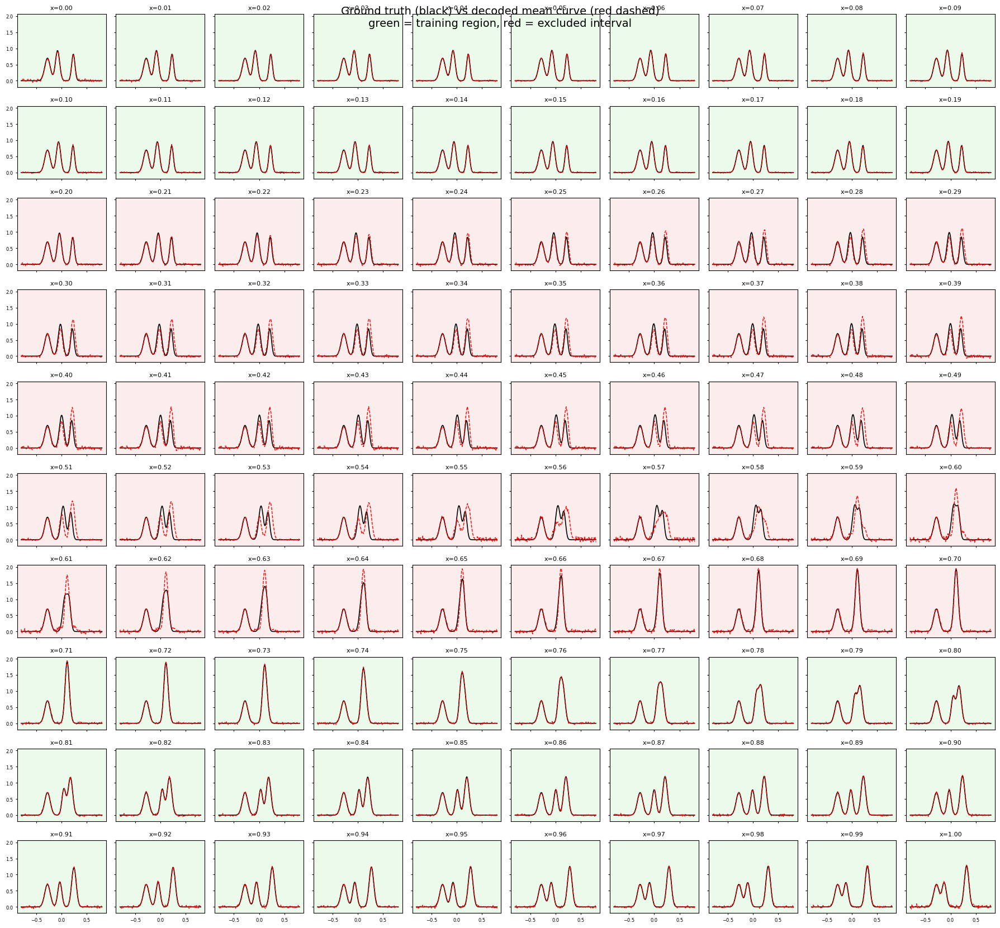

In [51]:
# ============================================================
# Cell 3: 10x10 comparison table
# ============================================================

fig, axes = plt.subplots(10, 10, figsize=(18, 18), sharex=True, sharey=True)

for i, ax in enumerate(axes.flatten()):
    ax.plot(u, Y_clean[i], color="black", linewidth=1.2)
    ax.plot(u, Y_decoded_mean[i], color="red", linestyle="--", linewidth=1.0)

    if train_mask[i]:
        ax.set_facecolor((0.92, 0.98, 0.92))
    else:
        ax.set_facecolor((0.99, 0.93, 0.93))

    ax.set_title(f"x={x[i]:.2f}", fontsize=8)
    ax.tick_params(labelsize=6, length=2)

plt.suptitle(
    "Ground truth (black) vs decoded mean curve (red dashed)\n"
    "green = training region, red = excluded interval",
    fontsize=14,
    y=0.92
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

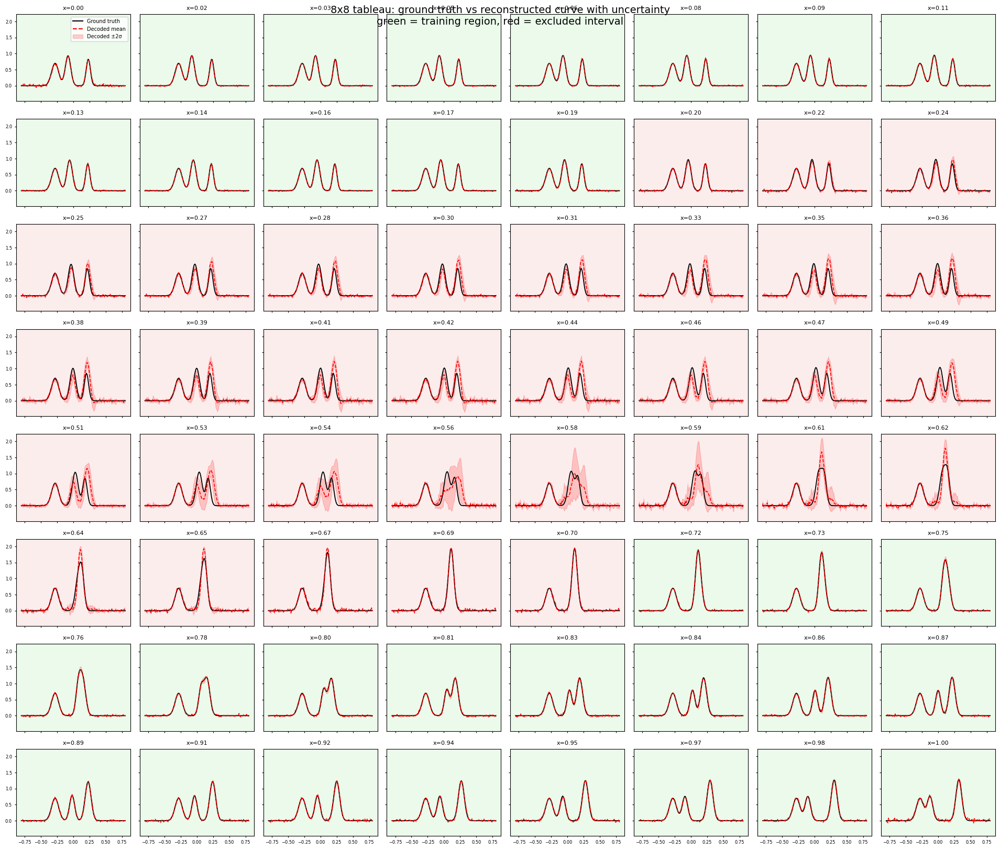

In [52]:
# ============================================================
# Cell: NxN tableau of reconstructed function with uncertainty
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

# ------------------------------------------------------------
# user settings
# ------------------------------------------------------------

N_table = 8          # gives N_table x N_table panels
n_mc_plot = 200      # number of posterior samples for decoded uncertainty
show_all_x_evenly = True

# ------------------------------------------------------------
# sample latent posterior and decode
# ------------------------------------------------------------

model.eval()

with torch.no_grad():
    z1_s, z2_s, _, _ = model.sample_latents(n_mc=n_mc_plot)   # (n_mc, N)
    Y_s = model.decode_from_latents(z1_s, z2_s).cpu().numpy() # (n_mc, N, D)

Y_mean = Y_s.mean(axis=0)     # (N, D)
Y_std = Y_s.std(axis=0)       # (N, D)

# ------------------------------------------------------------
# choose which x-locations to display
# ------------------------------------------------------------

N_total = len(x)
n_panels = N_table * N_table

if show_all_x_evenly:
    idx_plot = np.linspace(0, N_total - 1, n_panels).round().astype(int)
else:
    idx_plot = np.arange(min(n_panels, N_total))

# ------------------------------------------------------------
# plot tableau
# ------------------------------------------------------------

fig, axes = plt.subplots(N_table, N_table, figsize=(2.4 * N_table, 2.2 * N_table), sharex=True, sharey=True)

for k, ax in enumerate(axes.flatten()):
    i = idx_plot[k]

    # ground truth
    ax.plot(u, Y_clean[i], color="black", linewidth=1.3)

    # reconstructed mean
    ax.plot(u, Y_mean[i], color="red", linestyle="--", linewidth=1.2)

    # uncertainty band
    ax.fill_between(
        u,
        Y_mean[i] - 2.0 * Y_std[i],
        Y_mean[i] + 2.0 * Y_std[i],
        color="red",
        alpha=0.18
    )

    # background color for train/gap region
    if train_mask[i]:
        ax.set_facecolor((0.92, 0.98, 0.92))
    else:
        ax.set_facecolor((0.99, 0.93, 0.93))

    ax.set_title(f"x={x[i]:.2f}", fontsize=8)
    ax.tick_params(labelsize=6, length=2)

# legend proxy
axes[0, 0].plot([], [], color="black", linewidth=1.5, label="Ground truth")
axes[0, 0].plot([], [], color="red", linestyle="--", linewidth=1.5, label="Decoded mean")
axes[0, 0].fill_between([], [], [], color="red", alpha=0.18, label="Decoded ±2σ")
axes[0, 0].legend(fontsize=7, loc="upper right")

plt.suptitle(
    f"{N_table}x{N_table} tableau: ground truth vs reconstructed curve with uncertainty\n"
    "green = training region, red = excluded interval",
    fontsize=14,
    y=0.92
)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

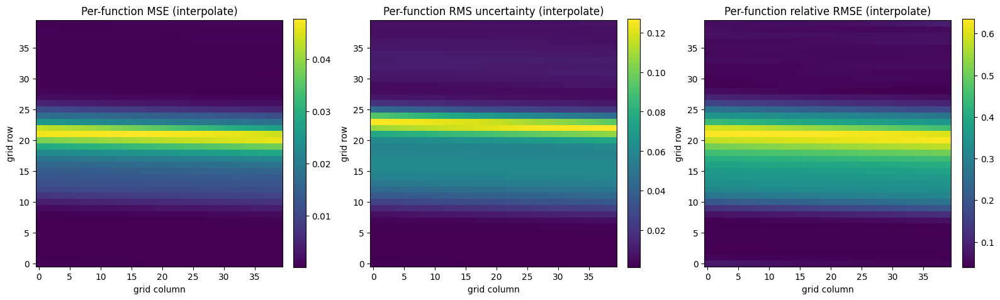

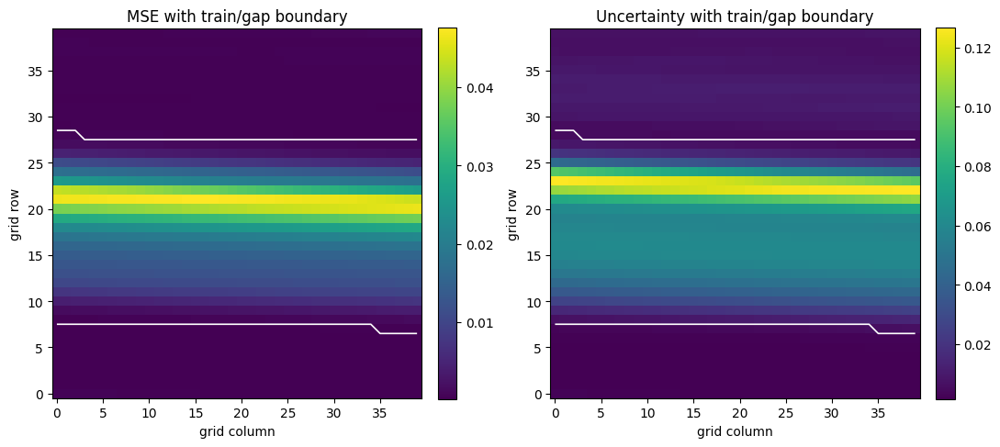

Display mode: interpolate
Grid side: 40
Mean MSE: 0.008520
Mean RMS uncertainty: 0.029464
Mean relative RMSE: 0.196749

Train-region mean MSE: 0.000349
Gap-region mean MSE:   0.016691
Train-region mean uncertainty: 0.005776
Gap-region mean uncertainty:   0.053153


In [55]:
# ============================================================
# Cell: per-function MSE and uncertainty maps as imshow
# Works for N < grid_side^2 by interpolation
# ============================================================

import numpy as np
import matplotlib.pyplot as plt
import torch

# ------------------------------------------------------------
# SETTINGS
# ------------------------------------------------------------

grid_side = 40          # display as 20x20
grid_mode = "interpolate"
# options:
#   "exact"        -> requires N >= grid_side^2
#   "interpolate"  -> interpolate metrics to grid_side^2 cells

n_mc_eval = 200

# ------------------------------------------------------------
# posterior decoded mean and std in data space
# ------------------------------------------------------------

model.eval()

with torch.no_grad():
    z1_s, z2_s, _, _ = model.sample_latents(n_mc=n_mc_eval)   # (n_mc, N)
    Y_s = model.decode_from_latents(z1_s, z2_s).cpu().numpy() # (n_mc, N, D)

Y_mean = Y_s.mean(axis=0)   # (N, D)
Y_std  = Y_s.std(axis=0)    # (N, D)

# ------------------------------------------------------------
# per-function scalar metrics
# ------------------------------------------------------------

mse_per_function = np.mean((Y_mean - Y_clean)**2, axis=1)
unc_per_function = np.sqrt(np.mean(Y_std**2, axis=1))

rmse_per_function = np.sqrt(mse_per_function)
signal_rms = np.sqrt(np.mean(Y_clean**2, axis=1)) + 1e-12
rel_rmse_per_function = rmse_per_function / signal_rms

# ------------------------------------------------------------
# reshape to image
# ------------------------------------------------------------

N_total = len(x)
required = grid_side * grid_side

if grid_mode == "exact":
    if N_total < required:
        raise ValueError(
            f"grid_side={grid_side} needs at least {required} functions, but current N={N_total}. "
            f"Either regenerate data with N={required}, reduce grid_side, or use grid_mode='interpolate'."
        )

    mse_img = mse_per_function[:required].reshape(grid_side, grid_side)
    unc_img = unc_per_function[:required].reshape(grid_side, grid_side)
    rel_rmse_img = rel_rmse_per_function[:required].reshape(grid_side, grid_side)
    train_img = train_mask[:required].reshape(grid_side, grid_side)

elif grid_mode == "interpolate":
    # interpolate along x onto a denser 1D grid, then reshape
    x_dense = np.linspace(x.min(), x.max(), required)

    mse_dense = np.interp(x_dense, x, mse_per_function)
    unc_dense = np.interp(x_dense, x, unc_per_function)
    rel_rmse_dense = np.interp(x_dense, x, rel_rmse_per_function)

    # nearest-neighbor style interpolation for mask
    train_dense = np.interp(x_dense, x, train_mask.astype(float)) > 0.5

    mse_img = mse_dense.reshape(grid_side, grid_side)
    unc_img = unc_dense.reshape(grid_side, grid_side)
    rel_rmse_img = rel_rmse_dense.reshape(grid_side, grid_side)
    train_img = train_dense.reshape(grid_side, grid_side)

else:
    raise ValueError(f"Unknown grid_mode: {grid_mode}")

# ------------------------------------------------------------
# plots
# ------------------------------------------------------------

fig, ax = plt.subplots(1, 3, figsize=(16, 5))

im0 = ax[0].imshow(mse_img, origin="lower", aspect="equal")
ax[0].set_title(f"Per-function MSE ({grid_mode})")
ax[0].set_xlabel("grid column")
ax[0].set_ylabel("grid row")
plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(unc_img, origin="lower", aspect="equal")
ax[1].set_title(f"Per-function RMS uncertainty ({grid_mode})")
ax[1].set_xlabel("grid column")
ax[1].set_ylabel("grid row")
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

im2 = ax[2].imshow(rel_rmse_img, origin="lower", aspect="equal")
ax[2].set_title(f"Per-function relative RMSE ({grid_mode})")
ax[2].set_xlabel("grid column")
ax[2].set_ylabel("grid row")
plt.colorbar(im2, ax=ax[2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# same maps with train/gap boundary overlay
# ------------------------------------------------------------

fig, ax = plt.subplots(1, 2, figsize=(11, 5))

im0 = ax[0].imshow(mse_img, origin="lower", aspect="equal")
ax[0].contour(train_img.astype(float), levels=[0.5], colors="white", linewidths=1.2)
ax[0].set_title("MSE with train/gap boundary")
ax[0].set_xlabel("grid column")
ax[0].set_ylabel("grid row")
plt.colorbar(im0, ax=ax[0], fraction=0.046, pad=0.04)

im1 = ax[1].imshow(unc_img, origin="lower", aspect="equal")
ax[1].contour(train_img.astype(float), levels=[0.5], colors="white", linewidths=1.2)
ax[1].set_title("Uncertainty with train/gap boundary")
ax[1].set_xlabel("grid column")
ax[1].set_ylabel("grid row")
plt.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()

# ------------------------------------------------------------
# summary numbers
# ------------------------------------------------------------

print(f"Display mode: {grid_mode}")
print(f"Grid side: {grid_side}")
print(f"Mean MSE: {mse_per_function.mean():.6f}")
print(f"Mean RMS uncertainty: {unc_per_function.mean():.6f}")
print(f"Mean relative RMSE: {rel_rmse_per_function.mean():.6f}")
print()
print(f"Train-region mean MSE: {mse_per_function[train_mask].mean():.6f}")
print(f"Gap-region mean MSE:   {mse_per_function[~train_mask].mean():.6f}")
print(f"Train-region mean uncertainty: {unc_per_function[train_mask].mean():.6f}")
print(f"Gap-region mean uncertainty:   {unc_per_function[~train_mask].mean():.6f}")